This Jupyter Notebook took as reference the article : https://towardsdatascience.com/convolutional-neural-networks-explained-how-to-successfully-classify-images-in-python-df829d4ba761

# Index   

1 -> check initial images and amend formats

2 -> wep scrapping of new images for each sport

3 -> validate new images: content, size

4 -> crop training images to 3 squared images

5 -> generation of arrays with images at the proper size and lists with labelling (testing/validation array included) 

6 ->  Create different Convolutional Neural Network/CNN: the simple one, with augmented images, adding an initial pertained model. 

7- > Training and validation 
save models

8 -> Prediction with the best CNN

# Importing libraries

In [199]:
# Tensorflow / Keras
import tensorflow as tf # used to access argmax function
from tensorflow import keras # for building Neural Networks
print('Tensorflow/Keras: %s' % keras.__version__) # print version
from keras.models import Sequential # for creating a linear stack of layers for our Neural Network
from keras import Input # for instantiating a keras tensor
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout, MaxPooling2D, AveragePooling2D, GlobalAveragePooling2D # for adding Concolutional and densely-connected NN layers.
from keras.preprocessing.image import ImageDataGenerator  
from tensorflow.keras.applications import vgg16, inception_v3, resnet50, mobilenet, Xception, InceptionV3,  VGG16, VGG19, ResNet50V2, ResNet101V2, ResNet152V2, InceptionResNetV2, MobileNetV2, DenseNet121, DenseNet169, DenseNet201, EfficientNetB0, EfficientNetB4, EfficientNetB7, NASNetLarge  #import pretrained CNN
from tensorflow.keras import applications 
from keras.models import model_from_json #to save models as json file
from keras.applications.inception_v3 import decode_predictions 
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam, RMSprop

#from tensorflow.keras.utils import to_categorical
 

# Data manipulation
import pandas as pd # for data manipulation
print('pandas: %s' % pd.__version__) # print version
import numpy as np # for data manipulation
print('numpy: %s' % np.__version__) # print version
import pathlib
from glob import glob
from tqdm import tqdm


# Sklearn
import sklearn # for model evaluation
print('sklearn: %s' % sklearn.__version__) # print version
from sklearn.model_selection import train_test_split # for splitting the data into train and test samples
from sklearn.preprocessing import OrdinalEncoder # for encoding labels
from sklearn.preprocessing import LabelEncoder
# from sklearn.model_selection import StratifiedShuffleSplit # to split stratified 
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, balanced_accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, matthews_corrcoef, roc_auc_score, confusion_matrix



# Visualization
import matplotlib.image as mpimg
import cv2 # for ingesting images
print('OpenCV: %s' % cv2.__version__) # print version
import matplotlib 
import matplotlib.pyplot as plt # for showing images
print('matplotlib: %s' % matplotlib.__version__) # print version
from PIL import Image
import random
import seaborn as sns
sns.set_style('white') 
from skimage import io #to visualize images

# To web scap new images
from bing_image_downloader import downloader
from selenium import webdriver 
#print('selenium: %s' % Selenium.__version__) # print version

# Other utilities
import sys
import os
from platform import python_version
import datetime
from time import localtime, strftime, gmtime



print('python version: %s' % python_version()) # print version


Tensorflow/Keras: 2.9.0
pandas: 1.4.2
numpy: 1.22.3
sklearn: 1.1.1
OpenCV: 4.6.0
matplotlib: 3.5.2
python version: 3.9.13


# Load, Transform and Explore (LTE) data (Images & Labels)

Images were downloaded and stored in the labtop. Images to be tested were saved duplicated (test and test2 folders), in test2 they were manually classified in the corresponding folder according to its label. The next folder structure is used in this project: 

In [3]:
# Folder structure for this project:
    
# C:\\Users\\march\\000 Treball Ju`yter 000\\Hackathons\\
# |--|--imag_recognition (folder)
# |--|--|--train (folder)
# |--|--|--|--baseball (folder)
# |--|--|--|--|--image_1.jpg
# |--|--|--|--|--image_2.jpg
# |--|--|--|--|--...
# |--|--|--|--cricket (folder)
# |--|--|--|--|--image_1.jpg
# |--|--|--|--|--image_2.jpg
# |--|--|--|--football (folder)
# |--|--|--|--|--image_1.jpg
# |--|--|--|--|--image_2.jpg
# |--|--|--|--|--...
# |--|--|--test (folder)
# |--|--|--|--image_1.jpg
# |--|--|--|--image_2.jpg
# |--|--|--output (folder) 
# |--|--|--test2 (folder)
# |--|--|--|--baseball (folder)
# |--|--|--|--|--image_1.jpg
# |--|--|--|--|--image_2.jpg
# |--|--|--|--|--...
# |--|--|--|--cricket (folder)
# |--|--|--|--|--image_1.jpg
# |--|--|--|--|--image_2.jpg
# |--|--|--|--football (folder)
# |--|--|--|--|--image_1.jpg
# |--|--|--|--|--image_2.jpg
# |--|--|--output (folder)

# Assign main directories to variables:
main_dir=os.path.dirname(sys.path[0])
train_images_dir = main_dir +'\\imag_recognition\\train'
test_images_dir = main_dir +'\\imag_recognition\\test'
path_test = main_dir +'\\imag_recognition\\test2'
save_dir = main_dir +'\\imag_recognition\\output'


## Number and format of files

First, number of files and its format was checked:

In [4]:
def non_jpg_files(folder_path):
    '''returns a list with the names of files that are non .jpg images.
            INPUT: path to be checked
            OUTPUT: list of images that are not .jpg'''
    list_no_jpg=[]
    new_list_files= os.listdir(folder_path)
    for i in range(0, len(new_list_files)):
        if new_list_files[i].split('.')[1] !='jpg':
            list_no_jpg.append (new_list_files[i])
    return list_no_jpg

def jpg_files(folder_path):
    '''returns a list with the names of files that are .jpg images.
            INPUT: path to be checked
            OUTPUT: list of images that are not .jpg'''
    list_jpg=[]
    new_list_files= os.listdir(folder_path)
    for i in range(0, len(new_list_files)):
        if new_list_files[i].split('.')[1] =='jpg':
            list_jpg.append (new_list_files[i])
    return list_jpg

In [5]:
def check_format_images(path):
    '''returns the info of how many files as .jpg and not .jpg are in the specified folder.
            INPUT: path to be checked
            OUTPUT: printed info'''
    non_jpg_images = non_jpg_files (path)
    jpg_images= jpg_files (path)
    print (f'In the folder \n {path} \n there are {len(os.listdir(path))} files: {len(jpg_images)} .jpg images and {len(non_jpg_images)} non jpg images. \n')

In [5]:
for i in os.listdir(train_images_dir):
       path = (os.path.join(train_images_dir, i))
       check_format_images(path)


In the folder 
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\baseball 
 there are 66 files: 66 .jpg images and 0 non jpg images. 

In the folder 
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\cricket 
 there are 80 files: 80 .jpg images and 0 non jpg images. 

In the folder 
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\football 
 there are 64 files: 64 .jpg images and 0 non jpg images. 



In [6]:
check_format_images(test_images_dir)

In the folder 
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\test 
 there are 41 files: 35 .jpg images and 6 non jpg images. 



An initial analysis of images showed that there are images of different formats in the train and test folders. To proper funtion, let's change the format of images to the same format (jpg) and also check if all images can be accessed by Python.  To do so, diferent functions are created:

In [6]:
def to_jpg_converter(folder_path, image_name):
    '''convert images to the jpg format (remove initial format!!)
        INPUT:  path where the image is and the name of the image 
        OUTPUT: save image in the same directory and delete image with the original format''' 
    path_file = os.path.join(folder_path, image_name) 
    try: 
        im = Image.open(path_file)
        new_name= image_name.split('.')[0] +'.jpg'
        image_new_format = os.path.join(folder_path, new_name)
        im.save(image_new_format)
        im.close()
    except: 
        print (f'image {image_name} could not be transformed' )
    remove_file (folder_path, image_name) 

In [7]:
def remove_file (folder_path, name_file):
    ''' remove file if exists. Else, it shows a warning message
            INPUT: path where the file is and name of the file with extension (.doc, .rmd, .jpg, ....)
            OUTPUT: warning message in case any error on name or path or deleting the file if all is fine
            
            path ha d'estar amb el format correcte!!
        '''
    # Path
    path_file = os.path.join(folder_path, name_file) 
    print (path_file)
    
    # Remove the file
    if os.path.exists(path_file):
        os.remove(path_file)
        print (name_file + ' deleted!!')
    else:
        print ('No file found with such name and route!')

In [104]:
# converting non jpg images to jpg in the train and test folders:

for i in ['baseball', 'cricket', 'football']: 
       path = (os.path.join(train_images_dir, i))
       non_jpg_images = non_jpg_files (path)
       for j in non_jpg_images:
                     to_jpg_converter(path, j)  
      
       path2 = (os.path.join(path_test, i))
       non_jpg_images_test = non_jpg_files (path2)
       for j in non_jpg_images_test:
                     to_jpg_converter(path2, j) 



c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\baseball\077d53ca-0425-48d6-b246-f2cd44f6bab8.png
077d53ca-0425-48d6-b246-f2cd44f6bab8.png deleted!!
c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\baseball\31d421c2-e4d9-4985-ade7-ed77846de880.jpeg
31d421c2-e4d9-4985-ade7-ed77846de880.jpeg deleted!!
c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\baseball\49fe45cb-b299-4a6f-b074-470e74c3a952.jpeg
49fe45cb-b299-4a6f-b074-470e74c3a952.jpeg deleted!!
c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\baseball\5fedd150-db15-4cc5-875e-f3479e6419cd.png
5fedd150-db15-4cc5-875e-f3479e6419cd.png deleted!!
c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\baseball\7335d23e-0731-45db-ad2e-69a27b2a873d.jpeg
7335d23e-0731-45db-ad2e-69a27b2a873d.jpeg deleted!!
c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\baseball\7d388775-a1d1-4603-9ab3-ccd0e8df4b25.jpeg


In [8]:
# Check again the file format of images
for i in os.listdir(train_images_dir):
       path = (os.path.join(train_images_dir, i))
       check_format_images(path)

In the folder 
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\baseball 
 there are 66 files: 66 .jpg images and 0 non jpg images. 

In the folder 
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\cricket 
 there are 80 files: 80 .jpg images and 0 non jpg images. 

In the folder 
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train\football 
 there are 64 files: 64 .jpg images and 0 non jpg images. 



In the training set the three different classes are not very imbalanced: 66m baseball, 80 cricket and 64 football. 

## Image resizing

Images to be introduced in the model should be all the same size. Resizing can be done as part of the pipeline in the neural network if working directly with directories. But it is worth to work with images as arrays to perform a cross validation study in the initial screening of pretrained models. As resizing distort the aspect ratio, let's check if images are far from being squared.

In [9]:
# List image categories we are interested in the training set
labels_set = set(os.listdir(train_images_dir))
labels_set

{'baseball', 'cricket', 'football'}

In [10]:
# Create two lists to contain image paths and image labels for training
ImagePaths_train=[]
ListLabels_train=[]
for label in labels_set:
    for image in list(os.listdir(train_images_dir+"/"+label)):
        ImagePaths_train = ImagePaths_train + [train_images_dir+"/"+label+"/"+image]
        ListLabels_train = ListLabels_train + [label]

LabelsArray_train=np.array(ListLabels_train)
enc = OrdinalEncoder()
y_train = enc.fit_transform(LabelsArray_train.reshape(-1,1))


In [11]:
# Create two lists to contain image paths and image labels from the testing images
ImagePaths_test = []
ListLabels_test = []
for label in labels_set:
    img_dir = 'C:\\Users\\march\\000 Treball Ju`yter 000\\Hackathons\\imag_recognition\\test2'+'\\'+label
    for image in list(os.listdir(img_dir)):
        ImagePaths_test=ImagePaths_test + [img_dir+"\\"+image]
        ListLabels_test=ListLabels_test +[label]

LabelsArray_test=np.array(ListLabels_test)
enc = OrdinalEncoder()
y_test = enc.fit_transform(LabelsArray_test.reshape(-1,1))

In [12]:
def check_shape_img(img_path):
    ''' Function to check how far is from a squared image (rows and columns in pixels):
            INPUT: image full path and new size (n pixels) to  be applied as squared n x n dimensions
            OUTPUT: return number of rows and columns and a message if rows > 2 x columns or columns > 2 x rows. Also print a message of error if it can not open the image'''
    if cv2.haveImageReader(img_path): #check if opencv can read the image
        image = cv2.imread(img_path)
        rows, cols, _ = image.shape
        if rows > 2*cols or cols> 2*rows:
            print (img_path,f'\n Image ratio far from squared: {rows} rows x {cols} columns!! ', )
        return rows, cols
    else:
        print (f'It was not able to open the image. \n {img_path} \n Possible causes: incorrect route, synthaxis, missing permissions,...')

In [13]:
def resize_image (img_path, size):
    ''' Function to resize an image ignoring original aspect ratio:
            INPUT: image full path and new size (n pixels) to  be applied as squared n x n dimensions
            OUTPUT: image of n x n pixels dimesions or message of error if it can not open the image'''
    
    if cv2.haveImageReader(img_path): #check if opencv can read the image
        image = cv2.imread(img_path)
        image = cv2.resize(image, (size, size))
        return image
    else:
        print ('It was not able to open the image. Possible causes: incorrect route, synthaxis, missing permissions,...')


Let's check how many images are far from squared (width > 2 x heigth or heigth > 2 x width) in the test and training sets:

In [14]:
for image in ImagePaths_train:
              check_shape_img (image)

for image in ImagePaths_test:
              check_shape_img (image)


c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train/football/177be2bb-31a9-4b8b-abb3-08a915cd6634.jpg 
 Image ratio far from squared: 197 rows x 400 columns!! 
c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\train/baseball/a67bb61e-95b8-49f1-bbc9-900897a50424.jpg 
 Image ratio far from squared: 187 rows x 400 columns!! 
C:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\test2\football\f2eeea85-9966-4f34-9769-7ef126490e3c.jpg 
 Image ratio far from squared: 199 rows x 400 columns!! 


There is only 3 images out of the limit of 2:1 or 1:2 ratio rows/columns and are nearly on the limit. No further actions will be taken.

## Array Generation with resizing

### Array 150 generation

In [24]:
def prepare_dataset(path, label, size):
    ''' Function to generate a list of arrays of resized images to targeted dimension ( n x n pixels) normalised (values 0 to 1) and a list of its labels:
            INPUT: full path where images are allocated (list), list of labels corresponding for each image (list) and the desired new size n (image target = n x n pixels, n as integer)
            OUTPUT: return 2 list -> 1st one of arrays of images of n x n size and normalized to be 0 to 1 values 
                                  -> 2nd one list of labels '''        
    x_train=[]
    y_train=[]
    all_images_path=glob(path+'/*.jpg')
    for img_path in tqdm(all_images_path) :
            img=load_img(img_path, target_size=(size,size))
            img=img_to_array(img)
            img=img/255.0
            x_train.append(img)
            y_train.append(label)
    return x_train,y_train

In [25]:
# Generate an array of images from test/validation resized to be 224x224 pixels, ignoring original aspect ratio
data_train_150=[]
for img in ImagePaths_train:
    image = resize_image(img, 150)
    data_train_150.append(image)
    
# Convert image data to numpy array and standardize values (divide by 255 since RGB values ranges from 0 to 255)
data_train_150 = np.array(data_train_150, dtype="float") / 255.0

# Convert Labels list to numpy array
LabelsArray_test=np.array(ListLabels_test)

# Encode labels 
enc = OrdinalEncoder()
y_test3=enc.fit_transform(LabelsArray_train.reshape(-1,1))

In [26]:
data_train_150.shape

(210, 150, 150, 3)

In [27]:
# Train dataset to 150 x 150
labels = os.listdir(train_images_dir)
x = []
y = []
for label in labels:
    x_, y_ = prepare_dataset(os.path.join(train_images_dir, label), label, 150)
    x.extend(x_)
    y.extend(y_)
x = np.array(x)
y = np.array(y)


100%|██████████| 64/64 [00:00<00:00, 354.54it/s]


In [28]:
# Test dataset

labels = os.listdir(path_test)
x_test = []
y_test = []
for label in labels:
    x_, y_ = prepare_dataset(os.path.join(path_test, label), label, 150)
    x_test.extend(x_)
    y_test.extend(y_)
x_test = np.array(x_test)
y_test = np.array(y_test)

# create the label encoder
encoder = LabelEncoder()

# encode labels to numbers
test_y  = encoder.fit_transform(y_test)
 



100%|██████████| 14/14 [00:00<00:00, 326.55it/s]


# Building the neuronal network

First, let's code some tools to visualize metrics, save models, load models,...

## Save/Load model and weigths

In [334]:
saving_directory = save_dir + '\\CNN models'

# SAVE
# to serialize the modelo to JSON (model = trained and compiled model)
def save_model (model):
    ''' Function to save trained neuronal network with wheghts:
            INPUT: model and model name as string
            OUTPUT: after saving two files in the working directory it prints an success message. 
            '''
    
    time = strftime("%Y_%m_%d_%H:%M", localtime())
    model_name = model.__name__
    model_name_json = model_name + '.json'
    model_name_json = saving_directory + '\\' + model_name_json 
    model_name_h5 = model_name + '.h5'
    model_name_h5 = saving_directory + '\\' + model_name_h5

    model_json = model.to_json()
    with open(model_name_json, "w") as json_file:
        json_file.write(model_json)
    #to serialize the weights for HDF5
    model.save_weights(model_name_h5)
    print("Model saved. Date: ", time )

In [335]:
# LOAD / RECOVER
# to load the json file and load the model with weights

def load_model_and_weights(model_name):
    ''' Function to load saved models of neuronal network with wheghts (files should be in the working directori)
            INPUT: model name as string
            OUTPUT: return the model with the weights and print message if all is all right or something when wrong. 
            '''
    file_json = saving_directory+ '\\' + model_name+ '.json'
    file_h5 = saving_directory+ '\\' +model_name+ '.h5'
    try:
        json_file = open(file_json, 'r')
        loaded_model_json = json_file.read()
        json_file.close()
        loaded_model = model_from_json(loaded_model_json) # se cargan los pesos (weights) en el nuevo modelo
        loaded_model.load_weights(file_h5) # se cargan los pesos (weights) en el nuevo modelo
        print("Model loaded from PC") 
        return loaded_model
    except FileNotFoundError: 
        print (f'It was no possible to charge this model, please check the name and route of files: \n{model_name}.json \n{model_name}.h5')  


## Explore results (plots, confusion matrix, reports)


In [337]:
def plot_loss_accur (history_model):
    
    fig, axs = plt.subplots(2, 1, figsize=(15,15))

    axs[0].plot(history_model.history['loss'])
    axs[0].plot(history_model.history['val_loss'])
    axs[0].title.set_text('Training Loss vs Validation Loss')
    axs[0].set_xlabel('Epochs')
    axs[0].set_ylabel('Loss')
    axs[0].legend(['Train','Val'])

    axs[1].plot(history_model.history['accuracy'])
    axs[1].plot(history_model.history['val_accuracy'])
    axs[1].title.set_text('Training Accuracy vs Validation Accuracy')
    axs[1].set_xlabel('Epochs')
    axs[1].set_ylabel('Accuracy')
    axs[1].legend(['Train', 'Val'])


In [338]:
def confusion_matrix_predictions(test_labels, pred_labels, list_classes):
    '''function to draw the confusion matrix:
            INPUT: 2 list of equal length
            OUTPUT: draw the confusion matrix if lenght have same length'''
    if len(test_labels) != len(pred_labels):
        print ('Length of lists should be the same, incorrect lists!')
    else: 
        class_names = set(pred_labels + test_labels )        
        CM = confusion_matrix(test_labels, pred_labels)
        ax = plt.axes()
        sns.heatmap(CM, annot=True, 
                annot_kws={"size": 12}, 
                xticklabels=list_classes, 
                yticklabels=list_classes, 
                cmap='viridis_r',
                ax = ax)
        ax.set_title('Confusion matrix')
        ax.set_ylabel('True labels')
        ax.set_xlabel('Predicted labels')
        plt.show()

In [339]:
def report_df(true_labels, pred_labels):
    '''Funtion to generate a datafarame from the report generated by Keras from the true labels list vs predicted label list:
            INPUT: 2 list of equal length
            OUTPUT: a dataframe containing all the info from the report of predictions.'''
    if len(true_labels) != len(pred_labels):
        print ('Length of lists should be the same, incorrect lists!')
    else:
        report = classification_report(true_labels, pred_labels, output_dict=True)
        df = pd.DataFrame(report).transpose()
        return df  

## Construction of CNN with pretrained models 

In [7]:
def pretrained_model_classification(x_train, y_train, x_valid, y_valid, x_test, test_y,  _model, batch_size=32, epochs_num=100, patience=3, num_classes=3):
    '''
    This function create a new model using transfer learning, train the model and evaluate it. 
    INPUT
        @param x_train: (numpy array, matrix) matrix containing pixels values of the train set
        @param y_train: (numpy array) list of label (int values) for the train set
        @param x_valid: (numpy array, matrix) matrix containing pixels values of the validation set
        @param y_valid: (numpy array) list of label (int values) for the validation set
        @param x_test: (numpy array, matrix) matrix containing pixels values of the test set
        @param test_y: (numpy array) list of label (int values) for the test set
        @param _model: (model) pretrained model 
        @param batch_size: (int) number of images for each batch default 32
        @param epochs_num: (int) number of epochs for the fit() default 100
        @param patience: (int) number of iteration without learning to break the training default 3
    OUTPUT
        @return history: (history object) containing the information of the training process
        @return results: (dataframe) pandas dataframe containing the metrics of the model evaluated on the test set
        print the process of training
    '''
    # create an instance of the pretrained model
    base_model = _model
    # freeze the layers of the pretrained model
    for layer in base_model.layers:
        layer.trainable = False
    
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = keras.layers.Dense(1024, activation='relu')(x)
    x = keras.layers.Dropout(0.2)(x)                  
    x = keras.layers.Dense(3, activation='softmax')(x)           
    # create a new model with pretrained + last new layers
    model_final = Model(base_model.input, x) 
    # compile 
    model_final.compile(optimizer = 'adam', 
                  loss = 'sparse_categorical_crossentropy', 
                  metrics = ['accuracy'])
    # fit the model with early stopping
    es = tf.keras.callbacks.EarlyStopping(patience=patience)
    history = model_final.fit(
                  x_train, y_train,
                  validation_data=(x_valid, y_valid), callbacks=[es], epochs=epochs_num, batch_size=batch_size)
    # predict the test
    y_pred = model_final.predict(x_test)
    # evaluate the results on the test set
    class_sport = ['baseball', 'cricket','football']

    
    label_predicted = [ class_sport [x.argmax()] for x in y_pred]
    label_predicted_num = [ x.argmax() for x in y_pred]
    label_real = [class_sport [int(x)] for x in test_y]
    label_real_num = [ x for x in test_y]
    
    confusion_matrix_predictions (label_real_num, label_predicted_num, class_sport)
    report_metrics = report_df(label_real, label_predicted)
    return history, report_metrics #, results

# Screening of several pretrained models

For a cross validation in the screening of pretrained models, let's make three different splits train/test keeping ratio of classes / labels and in a highly randomized way by using StratifiedShuffleSplitto.

In [27]:
# Split the training data set into training and validation=test (3 different splits are saved within a dataframe)

sss = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)
sss.get_n_splits(data_train_150, y_test3)

print(sss)
df_train_test = pd.DataFrame()
X_tr, y_tr, X_tst, y_tst =[], [], [], []

for train_index, test_index in sss.split(data_train_150, y_test3):
    
    X_train, X_test = data_train_150[train_index], data_train_150[test_index]
    y_train, y_test = y_test3[train_index], y_test3[test_index]
    X_tr.append(X_train)
    X_tst.append (X_test)
    y_tr.append (y_train)
    y_tst.append (y_test)


zipped = list(zip(X_tr, X_tst , y_tr, y_tst))
df_train_test = pd.DataFrame(zipped, columns=['X_train', 'X_test','y_train','y_test'])


StratifiedKFold(n_splits=3, random_state=0, shuffle=True)



 ********************************************* 
 Model:  Xception
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 20s 3s/step - loss: 1.2302 - accuracy: 0.4643 - val_loss: 1.3194 - val_accuracy: 0.5286
Epoch 2/30
5/5 [==============================] - 15s 3s/step - loss: 0.3666 - accuracy: 0.8429 - val_loss: 0.7060 - val_accuracy: 0.7714
Epoch 3/30
2/2 [==============================] - 4s 625ms/step


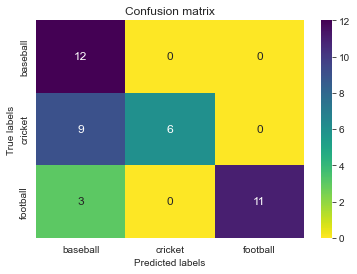


 ********************************************* 
 Model:  ResNet50V2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 19s 3s/step - loss: 2.8530 - accuracy: 0.3643 - val_loss: 1.1073 - val_accuracy: 0.6571
Epoch 2/30
2/2 [==============================] - 3s 473ms/step


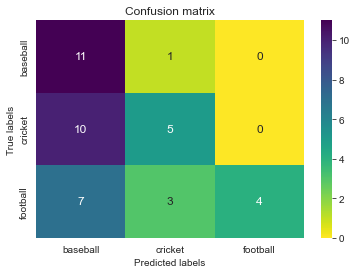


 ********************************************* 
 Model:  ResNet101V2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 36s 6s/step - loss: 2.5468 - accuracy: 0.4429 - val_loss: 2.1546 - val_accuracy: 0.6143
Epoch 2/30
5/5 [==============================] - 22s 5s/step - loss: 0.7262 - accuracy: 0.7643 - val_loss: 1.1918 - val_accuracy: 0.6286
Epoch 3/30
2/2 [==============================] - 7s 859ms/step


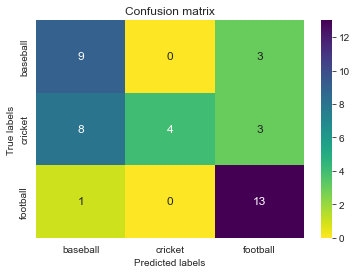


 ********************************************* 
 Model:  ResNet152V2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 49s 8s/step - loss: 3.0101 - accuracy: 0.3929 - val_loss: 2.2334 - val_accuracy: 0.5143
Epoch 2/30
5/5 [==============================] - 31s 6s/step - loss: 0.9039 - accuracy: 0.7357 - val_loss: 1.2464 - val_accuracy: 0.6857
Epoch 3/30
2/2 [==============================] - 9s 1s/step


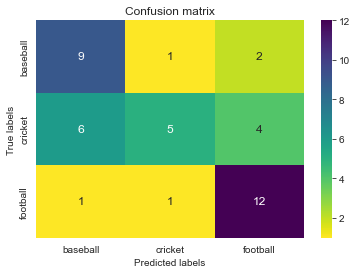


 ********************************************* 
 Model:  InceptionResNetV2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 34s 4s/step - loss: 2.7433 - accuracy: 0.3786 - val_loss: 2.1290 - val_accuracy: 0.5429
Epoch 2/30
2/2 [==============================] - 7s 626ms/step


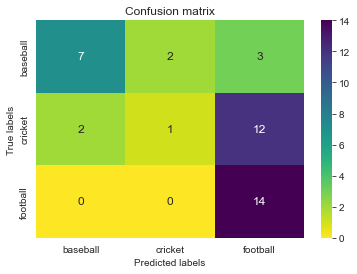


 ********************************************* 
 Model:  MobileNetV2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 9s 1s/step - loss: 3.0241 - accuracy: 0.3071 - val_loss: 1.1079 - val_accuracy: 0.5143
Epoch 2/30
5/5 [==============================] - 3s 725ms/step - loss: 1.0428 - accuracy: 0.6357 - val_loss: 0.6987 - val_accuracy: 0.7429
Epoch 3/30
5/5 [==============================] - 4s 669ms/step - loss: 0.6382 - accuracy: 0.8071 - val_loss: 0.6886 - val_accuracy: 0.7000
Epoch 4/30
2/2 [==============================] - 2s 160ms/step


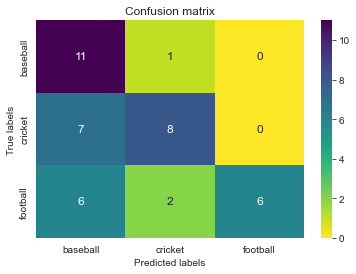


 ********************************************* 
 Model:  DenseNet121
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 24s 3s/step - loss: 2.3909 - accuracy: 0.4143 - val_loss: 1.3544 - val_accuracy: 0.5143
Epoch 2/30
5/5 [==============================] - 13s 3s/step - loss: 0.7747 - accuracy: 0.6929 - val_loss: 1.2787 - val_accuracy: 0.5286
Epoch 3/30
5/5 [==============================] - 13s 3s/step - loss: 0.4128 - accuracy: 0.8714 - val_loss: 0.9204 - val_accuracy: 0.6429
Epoch 4/30
5/5 [==============================] - 13s 3s/step - loss: 0.2859 - accuracy: 0.8786 - val_loss: 0.8256 - val_accuracy: 0.7143
Epoch 5/30
2/2 [==============================] - 5s 574ms/step


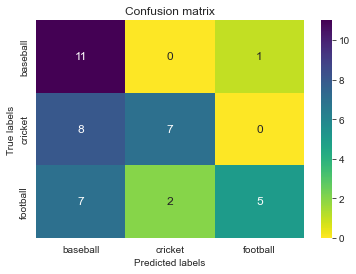


 ********************************************* 
 Model:  DenseNet169
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 31s 4s/step - loss: 3.4220 - accuracy: 0.2500 - val_loss: 0.8491 - val_accuracy: 0.6571
Epoch 2/30
2/2 [==============================] - 7s 811ms/step


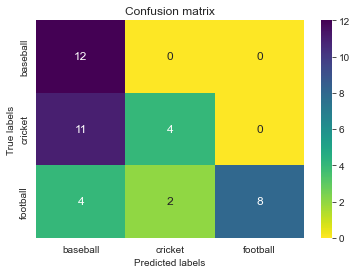


 ********************************************* 
 Model:  DenseNet201
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 43s 6s/step - loss: 2.4320 - accuracy: 0.3571 - val_loss: 1.4019 - val_accuracy: 0.6000
Epoch 2/30
5/5 [==============================] - 25s 5s/step - loss: 0.8766 - accuracy: 0.7143 - val_loss: 1.3875 - val_accuracy: 0.5571
Epoch 3/30
5/5 [==============================] - 20s 4s/step - loss: 0.5828 - accuracy: 0.8071 - val_loss: 0.8366 - val_accuracy: 0.7571
Epoch 4/30
2/2 [==============================] - 8s 878ms/step


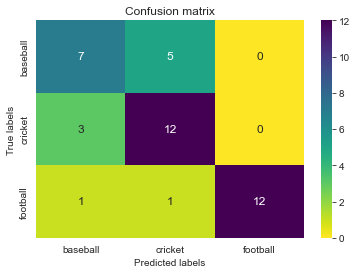


 ********************************************* 
 Model:  EfficientNetB0
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 19s 2s/step - loss: 1.5244 - accuracy: 0.3000 - val_loss: 1.4973 - val_accuracy: 0.3143
Epoch 2/30
5/5 [==============================] - 8s 2s/step - loss: 1.3775 - accuracy: 0.3643 - val_loss: 1.2106 - val_accuracy: 0.3714
Epoch 3/30
5/5 [==============================] - 7s 2s/step - loss: 1.2143 - accuracy: 0.3286 - val_loss: 1.0971 - val_accuracy: 0.3714
Epoch 4/30
2/2 [==============================] - 5s 320ms/step


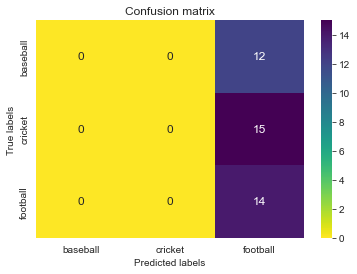

c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(r


 ********************************************* 
 Model:  EfficientNetB4
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 47s 6s/step - loss: 1.3671 - accuracy: 0.3429 - val_loss: 1.2846 - val_accuracy: 0.3143
Epoch 2/30
2/2 [==============================] - 8s 755ms/step


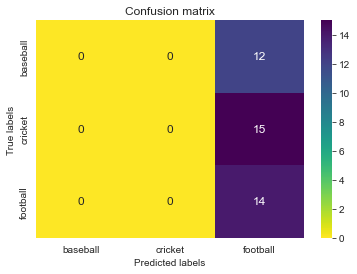

c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(r


 ********************************************* 
 Model:  EfficientNetB7
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 90s 12s/step - loss: 3.3595 - accuracy: 0.3214 - val_loss: 3.5224 - val_accuracy: 0.3143
Epoch 2/30
5/5 [==============================] - 54s 12s/step - loss: 2.1750 - accuracy: 0.3643 - val_loss: 2.5307 - val_accuracy: 0.3714
Epoch 3/30
5/5 [==============================] - 53s 11s/step - loss: 2.2146 - accuracy: 0.3357 - val_loss: 1.2751 - val_accuracy: 0.3143
Epoch 4/30
2/2 [==============================] - 17s 2s/step


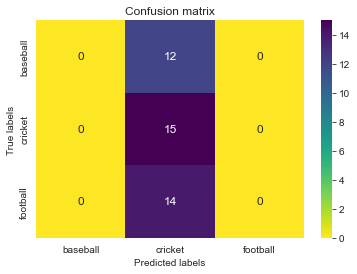

c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(r


 ********************************************* 
 Model:  VGG16
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 40s 9s/step - loss: 1.3377 - accuracy: 0.4143 - val_loss: 1.0307 - val_accuracy: 0.4714
Epoch 2/30
5/5 [==============================] - 44s 9s/step - loss: 0.9234 - accuracy: 0.6071 - val_loss: 0.9855 - val_accuracy: 0.5429
Epoch 3/30
5/5 [==============================] - 45s 10s/step - loss: 0.7891 - accuracy: 0.6571 - val_loss: 0.8559 - val_accuracy: 0.5571
Epoch 4/30
5/5 [==============================] - 48s 10s/step - loss: 0.7004 - accuracy: 0.7071 - val_loss: 0.8199 - val_accuracy: 0.6143
Epoch 5/30
5/5 [==============================] - 59s 13s/step - loss: 0.5916 - accuracy: 0.8000 - val_loss: 0.8019 - val_accuracy: 0.6286
Epoch 6/30
5/5 [==============================] - 75s 16s/step - loss: 0.5183 - accuracy: 0.8214 - val_loss: 0.7961 - val_accuracy: 0.6000
Epoch 7/30
5/5 [==============================] - 51s 1

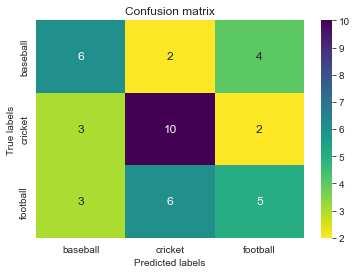


 ********************************************* 
 Model:  VGG19
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 61s 12s/step - loss: 1.4708 - accuracy: 0.3500 - val_loss: 1.2304 - val_accuracy: 0.4000
Epoch 2/30
5/5 [==============================] - 66s 14s/step - loss: 1.1165 - accuracy: 0.4071 - val_loss: 1.0431 - val_accuracy: 0.4857
Epoch 3/30
5/5 [==============================] - 69s 15s/step - loss: 0.9053 - accuracy: 0.5929 - val_loss: 0.9629 - val_accuracy: 0.5286
Epoch 4/30
5/5 [==============================] - 60s 13s/step - loss: 0.8255 - accuracy: 0.6857 - val_loss: 0.8918 - val_accuracy: 0.6429
Epoch 5/30
5/5 [==============================] - 65s 14s/step - loss: 0.7903 - accuracy: 0.6429 - val_loss: 0.8363 - val_accuracy: 0.6286
Epoch 6/30
2/2 [==============================] - 14s 3s/step


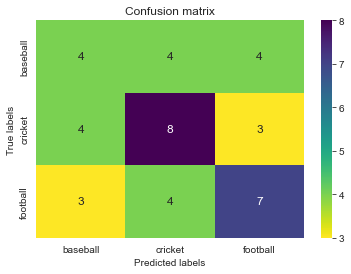


 ********************************************* 
 Model:  InceptionV3
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 17s 2s/step - loss: 4.9713 - accuracy: 0.3214 - val_loss: 6.0855 - val_accuracy: 0.4143
Epoch 2/30
5/5 [==============================] - 9s 2s/step - loss: 3.3711 - accuracy: 0.5643 - val_loss: 3.3673 - val_accuracy: 0.5286
Epoch 3/30
5/5 [==============================] - 11s 3s/step - loss: 1.8466 - accuracy: 0.6571 - val_loss: 1.9062 - val_accuracy: 0.5286
Epoch 4/30
2/2 [==============================] - 4s 351ms/step


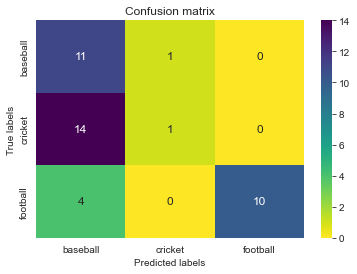

In [40]:
list_pretrained = [ Xception, ResNet50V2, ResNet101V2, ResNet152V2, InceptionResNetV2, 
                    MobileNetV2, DenseNet121, DenseNet169, DenseNet201, EfficientNetB0,
                     EfficientNetB4, EfficientNetB7, VGG16, VGG19, InceptionV3]

hist_models=[]
predictions=[]
name_models=[]
val_accur = []

for model in list_pretrained:
    name = model.__name__
    print ('\n','*'*45,f'\n Model:  {name}\n', '*'*45,'\n')
    _hists, prediction = pretrained_model_classification(df_train_test['X_train'][0], 
                                                            df_train_test['y_train'][0], 
                                                            df_train_test['X_test'][0],  
                                                            df_train_test['y_test'][0],
                                                             x_test, 
                                                             test_y,
                                    _model=model(weights='imagenet', include_top=False, input_shape=(150, 150, 3)), 
                                    batch_size=32, epochs_num=30, patience=1, num_classes=3)
    
    hist_models.append (_hists)
    predictions.append (prediction)
    name_models.append (name)
    val_accur. append ( round (max (_hists.history ['val_accuracy']), 3) )

    

Let's collect all results for the tested models. Next dataframe compare for each model the best accuracy obtained for the validation dataset vs the metrics obtained for the test set of images to be classified. 

In [50]:
'''vigilar en la funció per fer anar el CNN
els formats del labeling han de ser diferents pel test i pel train!!! 
test només cal que sigui un array però en el train cal canviar-li la dimensió a dues!!!'''

'vigilar en la funció per fer anar el CNN\nels formats del labeling han de ser diferents pel test i pel train!!! \ntest només cal que sigui un array però en el train cal canviar-li la dimensió a dues!!!'

In [41]:
# Generation of a dataframe collecting f1 macro scores for all methods when applied to the test set of pictures.
f1 = [ round(x.at ['macro avg' , 'f1-score'],3) for x in predictions]
precision = [ round(x.at ['macro avg' , 'precision'],3) for x in predictions]
recall = [ round(x.at ['macro avg', 'recall'],3) for x in predictions]
zipped = list(zip(name_models, val_accur, precision, recall, f1))
df_results = pd.DataFrame(zipped, columns=['Name', 'max_val_accur', 'Precision_avg','Recall_avg','f1_macro'])
df_results.sort_values(by = 'f1_macro', ascending= False)

,Name,max_val_accur,Precision_avg,Recall_avg,f1_macro
8,DenseNet201,0.757,0.768,0.747,0.753
0,Xception,0.771,0.833,0.729,0.706
3,ResNet152V2,0.686,0.648,0.647,0.616
5,MobileNetV2,0.743,0.729,0.626,0.609
2,ResNet101V2,0.643,0.728,0.648,0.603
7,DenseNet169,0.657,0.704,0.613,0.575
6,DenseNet121,0.714,0.678,0.580,0.554
12,VGG16,0.643,0.503,0.508,0.502
14,InceptionV3,0.614,0.626,0.566,0.496
4,InceptionResNetV2,0.543,0.531,0.550,0.476


To check training/set split influence on the results. The screening is repeated with a different set of train and validation images. Models EfficientNet were discarded due to its very poor performance.



 ********************************************* 
 Model:  Xception
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 20s 3s/step - loss: 1.4693 - accuracy: 0.3929 - val_loss: 0.8396 - val_accuracy: 0.6571
Epoch 2/30
5/5 [==============================] - 19s 4s/step - loss: 0.3969 - accuracy: 0.8143 - val_loss: 0.6188 - val_accuracy: 0.7857
Epoch 3/30
2/2 [==============================] - 4s 723ms/step


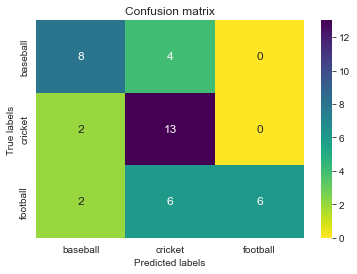


 ********************************************* 
 Model:  ResNet50V2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 19s 3s/step - loss: 2.3770 - accuracy: 0.4429 - val_loss: 0.7326 - val_accuracy: 0.7857
Epoch 2/30
2/2 [==============================] - 5s 502ms/step


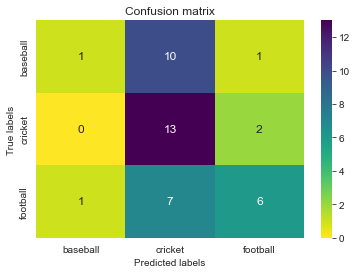


 ********************************************* 
 Model:  ResNet101V2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 41s 7s/step - loss: 4.6134 - accuracy: 0.3214 - val_loss: 3.0597 - val_accuracy: 0.3714
Epoch 2/30
5/5 [==============================] - 28s 6s/step - loss: 1.1866 - accuracy: 0.6929 - val_loss: 1.5788 - val_accuracy: 0.6714
Epoch 3/30
5/5 [==============================] - 29s 6s/step - loss: 0.6562 - accuracy: 0.7929 - val_loss: 0.6595 - val_accuracy: 0.7714
Epoch 4/30
2/2 [==============================] - 10s 1s/step


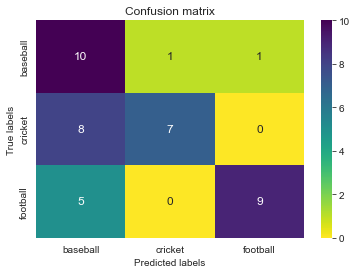


 ********************************************* 
 Model:  ResNet152V2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 61s 11s/step - loss: 2.6928 - accuracy: 0.3929 - val_loss: 1.9669 - val_accuracy: 0.5143
Epoch 2/30
5/5 [==============================] - 44s 9s/step - loss: 1.2920 - accuracy: 0.6500 - val_loss: 0.8790 - val_accuracy: 0.7143
Epoch 3/30
5/5 [==============================] - 50s 10s/step - loss: 0.6066 - accuracy: 0.8429 - val_loss: 0.7562 - val_accuracy: 0.7714
Epoch 4/30
2/2 [==============================] - 17s 3s/step


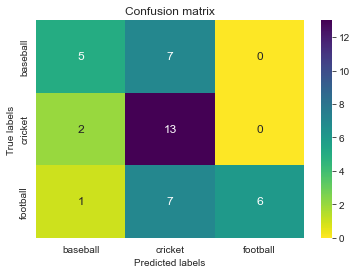


 ********************************************* 
 Model:  InceptionResNetV2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 40s 5s/step - loss: 5.6061 - accuracy: 0.3500 - val_loss: 0.8888 - val_accuracy: 0.6429
Epoch 2/30
2/2 [==============================] - 10s 680ms/step


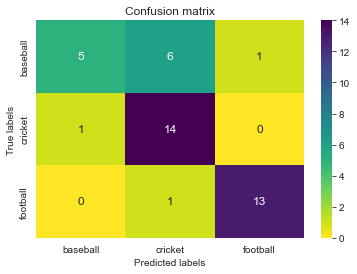


 ********************************************* 
 Model:  MobileNetV2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 9s 1s/step - loss: 2.9077 - accuracy: 0.3143 - val_loss: 1.0106 - val_accuracy: 0.6429
Epoch 2/30
5/5 [==============================] - 3s 662ms/step - loss: 1.4981 - accuracy: 0.6286 - val_loss: 0.9074 - val_accuracy: 0.7000
Epoch 3/30
2/2 [==============================] - 2s 182ms/step


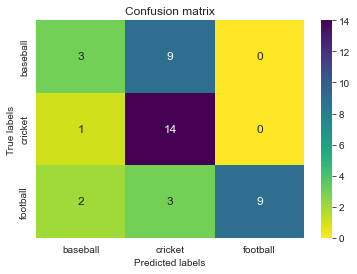


 ********************************************* 
 Model:  DenseNet121
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 30s 4s/step - loss: 1.6624 - accuracy: 0.4071 - val_loss: 2.1391 - val_accuracy: 0.4286
Epoch 2/30
5/5 [==============================] - 14s 3s/step - loss: 0.9577 - accuracy: 0.6643 - val_loss: 0.9026 - val_accuracy: 0.6286
Epoch 3/30
2/2 [==============================] - 6s 640ms/step


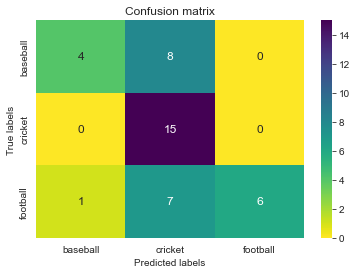


 ********************************************* 
 Model:  DenseNet169
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 35s 5s/step - loss: 2.4112 - accuracy: 0.4071 - val_loss: 2.6387 - val_accuracy: 0.3857
Epoch 2/30
5/5 [==============================] - 16s 3s/step - loss: 1.1368 - accuracy: 0.6857 - val_loss: 1.6435 - val_accuracy: 0.6000
Epoch 3/30
5/5 [==============================] - 19s 4s/step - loss: 0.4496 - accuracy: 0.8429 - val_loss: 1.1717 - val_accuracy: 0.5714
Epoch 4/30
2/2 [==============================] - 7s 663ms/step


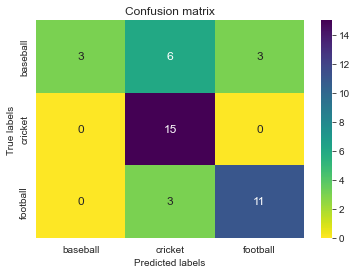


 ********************************************* 
 Model:  DenseNet201
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 46s 6s/step - loss: 2.5471 - accuracy: 0.3643 - val_loss: 1.3274 - val_accuracy: 0.5286
Epoch 2/30
5/5 [==============================] - 20s 4s/step - loss: 0.9536 - accuracy: 0.7000 - val_loss: 1.0968 - val_accuracy: 0.6571
Epoch 3/30
2/2 [==============================] - 9s 1s/step


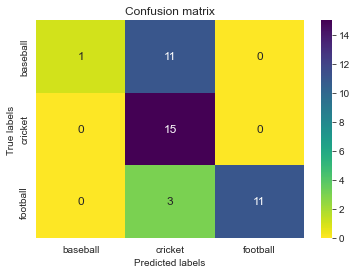


 ********************************************* 
 Model:  VGG16
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 58s 12s/step - loss: 1.3516 - accuracy: 0.4071 - val_loss: 1.2866 - val_accuracy: 0.3000
Epoch 2/30
5/5 [==============================] - 51s 11s/step - loss: 1.0644 - accuracy: 0.4714 - val_loss: 1.0287 - val_accuracy: 0.5571
Epoch 3/30
5/5 [==============================] - 55s 12s/step - loss: 0.8984 - accuracy: 0.5786 - val_loss: 0.8804 - val_accuracy: 0.6429
Epoch 4/30
5/5 [==============================] - 53s 11s/step - loss: 0.7917 - accuracy: 0.6714 - val_loss: 0.8328 - val_accuracy: 0.6857
Epoch 5/30
2/2 [==============================] - 11s 3s/step


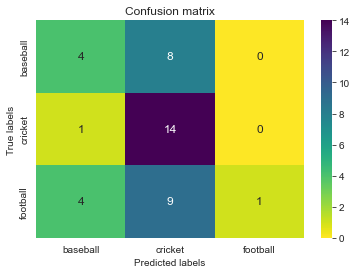


 ********************************************* 
 Model:  VGG19
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 69s 15s/step - loss: 1.4023 - accuracy: 0.2857 - val_loss: 1.1214 - val_accuracy: 0.3857
Epoch 2/30
5/5 [==============================] - 58s 12s/step - loss: 1.0169 - accuracy: 0.5000 - val_loss: 0.9993 - val_accuracy: 0.4857
Epoch 3/30
5/5 [==============================] - 62s 13s/step - loss: 0.8990 - accuracy: 0.5857 - val_loss: 0.9226 - val_accuracy: 0.5429
Epoch 4/30
5/5 [==============================] - 53s 10s/step - loss: 0.7761 - accuracy: 0.6714 - val_loss: 0.8601 - val_accuracy: 0.6429
Epoch 5/30
5/5 [==============================] - 46s 10s/step - loss: 0.7188 - accuracy: 0.7143 - val_loss: 0.8345 - val_accuracy: 0.5857
Epoch 6/30
5/5 [==============================] - 45s 9s/step - loss: 0.6523 - accuracy: 0.7714 - val_loss: 0.8071 - val_accuracy: 0.6286
Epoch 7/30
5/5 [==============================] - 55s 

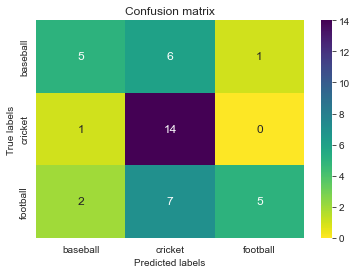


 ********************************************* 
 Model:  InceptionV3
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 16s 2s/step - loss: 8.1660 - accuracy: 0.2929 - val_loss: 2.5795 - val_accuracy: 0.5571
Epoch 2/30
5/5 [==============================] - 7s 2s/step - loss: 2.0424 - accuracy: 0.5357 - val_loss: 1.4993 - val_accuracy: 0.6143
Epoch 3/30
2/2 [==============================] - 5s 385ms/step


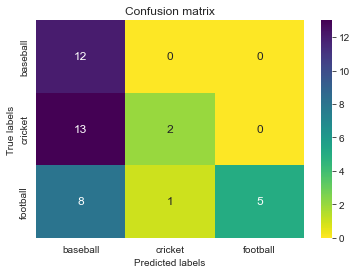

In [42]:
list_pretrained = [   Xception, ResNet50V2, ResNet101V2, ResNet152V2, InceptionResNetV2, 
                    MobileNetV2, DenseNet121, DenseNet169, DenseNet201, VGG16, VGG19,
                    InceptionV3
                    ]

hist_models2=[]
predictions2=[]
name_models2=[]
val_accur2 = []

for model in list_pretrained:
    name = model.__name__
    print ('\n','*'*45,f'\n Model:  {name}\n', '*'*45,'\n')
    _hists, prediction = pretrained_model_classification(df_train_test['X_train'][1], 
                                                            df_train_test['y_train'][1], 
                                                            df_train_test['X_test'][1],  
                                                            df_train_test['y_test'][1],
                                                             x_test, 
                                                             test_y,
                                    _model=model(weights='imagenet', include_top=False, input_shape=(150, 150, 3)), 
                                    batch_size=32, epochs_num=30, patience=1, num_classes=3)    
    
    hist_models2.append(_hists)
    predictions2.append(prediction)
    name_models2.append(name)
    val_accur2. append ( round (max (_hists.history ['val_accuracy']), 3) )

In [43]:
# Generation of a dataframe collecting f1 macro scores for all methods when applied to the test set of pictures.
f1 = [ round(x.at ['macro avg' , 'f1-score'],3) for x in predictions2]
precision = [ round(x.at ['macro avg' , 'precision'],3) for x in predictions2]
recall = [ round(x.at ['macro avg', 'recall'],3) for x in predictions2]
zipped = list(zip(name_models2, val_accur2, precision, recall, f1))
df_results2 = pd.DataFrame(zipped, columns=['Name', 'max_val_accur', 'Precision_avg','Recall_avg','f1_macro'])
df_results2.sort_values(by = 'f1_macro', ascending= False)

,Name,max_val_accur,Precision_avg,Recall_avg,f1_macro
4,InceptionResNetV2,0.686,0.810,0.760,0.754
7,DenseNet169,0.714,0.804,0.679,0.652
0,Xception,0.786,0.744,0.654,0.650
2,ResNet101V2,0.771,0.737,0.648,0.643
5,MobileNetV2,0.700,0.679,0.609,0.600
6,DenseNet121,0.629,0.767,0.587,0.579
3,ResNet152V2,0.771,0.702,0.571,0.573
8,DenseNet201,0.657,0.839,0.623,0.572
10,VGG19,0.729,0.659,0.569,0.556
11,InceptionV3,0.614,0.677,0.497,0.427



 ********************************************* 
 Model:  Xception
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 22s 4s/step - loss: 1.4597 - accuracy: 0.4357 - val_loss: 0.8178 - val_accuracy: 0.6571
Epoch 2/30
5/5 [==============================] - 17s 4s/step - loss: 0.6594 - accuracy: 0.8071 - val_loss: 0.6140 - val_accuracy: 0.7429
Epoch 3/30
2/2 [==============================] - 11s 1s/step


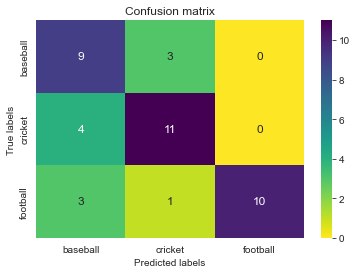


 ********************************************* 
 Model:  ResNet50V2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 30s 4s/step - loss: 1.9080 - accuracy: 0.4429 - val_loss: 2.1873 - val_accuracy: 0.4714
Epoch 2/30
5/5 [==============================] - 13s 3s/step - loss: 0.7118 - accuracy: 0.7571 - val_loss: 1.0808 - val_accuracy: 0.7714
Epoch 3/30
2/2 [==============================] - 4s 580ms/step


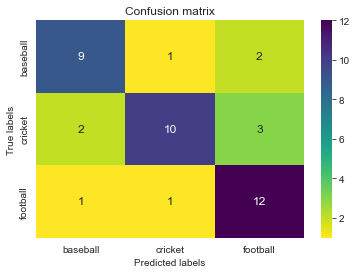


 ********************************************* 
 Model:  ResNet101V2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 48s 8s/step - loss: 2.6364 - accuracy: 0.3643 - val_loss: 1.0668 - val_accuracy: 0.6857
Epoch 2/30
5/5 [==============================] - 33s 7s/step - loss: 0.4392 - accuracy: 0.8571 - val_loss: 0.9837 - val_accuracy: 0.7286
Epoch 3/30
5/5 [==============================] - 31s 6s/step - loss: 0.1266 - accuracy: 0.9357 - val_loss: 0.8831 - val_accuracy: 0.7286
Epoch 4/30
2/2 [==============================] - 7s 893ms/step


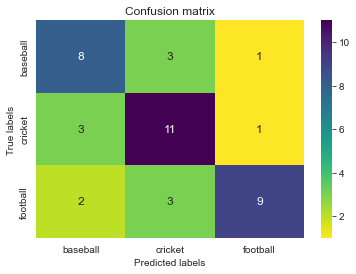


 ********************************************* 
 Model:  ResNet152V2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 53s 9s/step - loss: 2.3786 - accuracy: 0.4000 - val_loss: 1.8075 - val_accuracy: 0.5571
Epoch 2/30
5/5 [==============================] - 41s 8s/step - loss: 0.5676 - accuracy: 0.7929 - val_loss: 0.9058 - val_accuracy: 0.7143
Epoch 3/30
2/2 [==============================] - 13s 2s/step


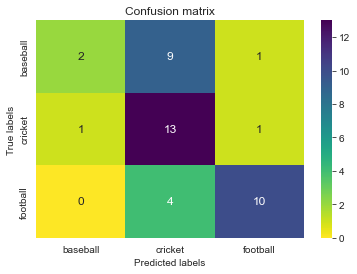


 ********************************************* 
 Model:  InceptionResNetV2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 77s 7s/step - loss: 3.4570 - accuracy: 0.3857 - val_loss: 1.8130 - val_accuracy: 0.5000
Epoch 2/30
5/5 [==============================] - 21s 5s/step - loss: 1.3656 - accuracy: 0.6429 - val_loss: 1.6629 - val_accuracy: 0.5714
Epoch 3/30
5/5 [==============================] - 21s 4s/step - loss: 1.3815 - accuracy: 0.6929 - val_loss: 1.1161 - val_accuracy: 0.6857
Epoch 4/30
2/2 [==============================] - 13s 1s/step


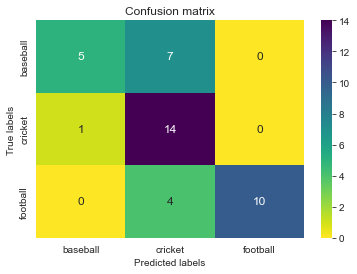


 ********************************************* 
 Model:  MobileNetV2
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 13s 1s/step - loss: 2.1082 - accuracy: 0.4143 - val_loss: 1.0731 - val_accuracy: 0.5857
Epoch 2/30
2/2 [==============================] - 3s 227ms/step


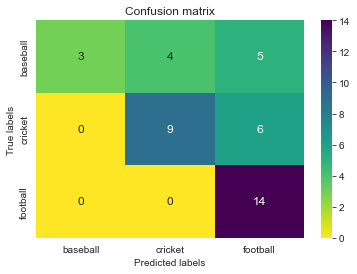


 ********************************************* 
 Model:  DenseNet121
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 38s 5s/step - loss: 3.6294 - accuracy: 0.3857 - val_loss: 1.5784 - val_accuracy: 0.4857
Epoch 2/30
5/5 [==============================] - 16s 3s/step - loss: 1.4385 - accuracy: 0.5286 - val_loss: 1.0030 - val_accuracy: 0.6000
Epoch 3/30
2/2 [==============================] - 7s 1s/step


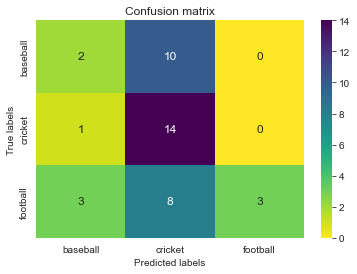


 ********************************************* 
 Model:  DenseNet169
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 42s 5s/step - loss: 2.8355 - accuracy: 0.4214 - val_loss: 2.7245 - val_accuracy: 0.4286
Epoch 2/30
5/5 [==============================] - 19s 4s/step - loss: 1.7087 - accuracy: 0.6143 - val_loss: 1.5906 - val_accuracy: 0.4286
Epoch 3/30
5/5 [==============================] - 18s 4s/step - loss: 0.7590 - accuracy: 0.7214 - val_loss: 1.4362 - val_accuracy: 0.6286
Epoch 4/30
5/5 [==============================] - 22s 5s/step - loss: 0.7076 - accuracy: 0.8000 - val_loss: 0.7753 - val_accuracy: 0.7429
Epoch 5/30
2/2 [==============================] - 9s 823ms/step


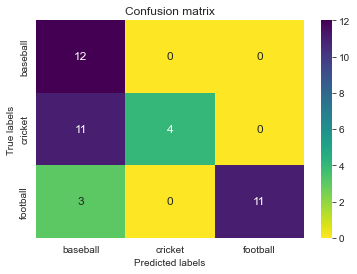


 ********************************************* 
 Model:  DenseNet201
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 52s 7s/step - loss: 1.9330 - accuracy: 0.4786 - val_loss: 1.5697 - val_accuracy: 0.6000
Epoch 2/30
2/2 [==============================] - 9s 1s/step


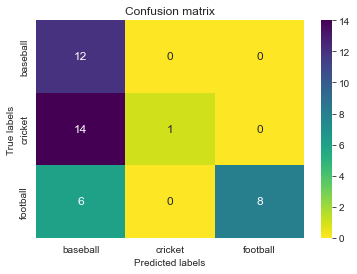


 ********************************************* 
 Model:  VGG16
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 59s 12s/step - loss: 1.3882 - accuracy: 0.3429 - val_loss: 1.0329 - val_accuracy: 0.4571
Epoch 2/30
5/5 [==============================] - 46s 10s/step - loss: 0.9465 - accuracy: 0.5429 - val_loss: 1.0126 - val_accuracy: 0.4714
Epoch 3/30
5/5 [==============================] - 50s 11s/step - loss: 0.9017 - accuracy: 0.5286 - val_loss: 0.8935 - val_accuracy: 0.5857
Epoch 4/30
5/5 [==============================] - 54s 11s/step - loss: 0.7610 - accuracy: 0.6929 - val_loss: 0.8595 - val_accuracy: 0.5857
Epoch 5/30
2/2 [==============================] - 9s 2s/step


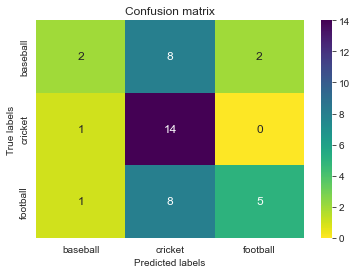


 ********************************************* 
 Model:  VGG19
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 67s 15s/step - loss: 1.3664 - accuracy: 0.2857 - val_loss: 1.0195 - val_accuracy: 0.4857
Epoch 2/30
5/5 [==============================] - 62s 13s/step - loss: 0.9367 - accuracy: 0.5786 - val_loss: 0.9290 - val_accuracy: 0.5429
Epoch 3/30
5/5 [==============================] - 63s 13s/step - loss: 0.8360 - accuracy: 0.7214 - val_loss: 0.8899 - val_accuracy: 0.5714
Epoch 4/30
5/5 [==============================] - 67s 14s/step - loss: 0.7304 - accuracy: 0.7071 - val_loss: 0.8436 - val_accuracy: 0.6571
Epoch 5/30
5/5 [==============================] - 64s 13s/step - loss: 0.7163 - accuracy: 0.7143 - val_loss: 0.8380 - val_accuracy: 0.5714
Epoch 6/30
5/5 [==============================] - 61s 13s/step - loss: 0.6211 - accuracy: 0.7786 - val_loss: 0.8214 - val_accuracy: 0.6429
Epoch 7/30
5/5 [==============================] - 59s

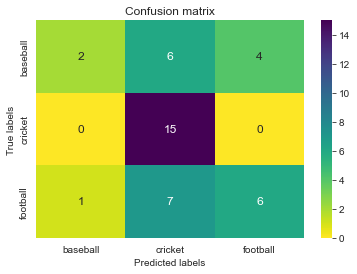


 ********************************************* 
 Model:  InceptionV3
 ********************************************* 

Epoch 1/30
5/5 [==============================] - 18s 2s/step - loss: 5.6532 - accuracy: 0.3643 - val_loss: 4.5846 - val_accuracy: 0.4429
Epoch 2/30
5/5 [==============================] - 8s 2s/step - loss: 3.1071 - accuracy: 0.5071 - val_loss: 1.9718 - val_accuracy: 0.6143
Epoch 3/30
2/2 [==============================] - 4s 381ms/step


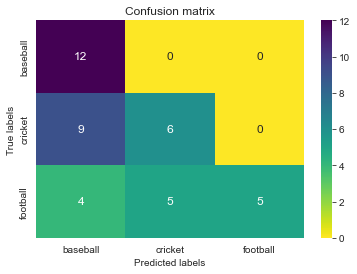

In [44]:
list_pretrained = [   Xception, ResNet50V2, ResNet101V2, ResNet152V2, InceptionResNetV2, 
                    MobileNetV2, DenseNet121, DenseNet169, DenseNet201, VGG16, VGG19,
                    InceptionV3
                    ]

hist_models3=[]
predictions3=[]
name_models3=[]
val_accur3 = []

for model in list_pretrained:
    name = model.__name__
    print ('\n','*'*45,f'\n Model:  {name}\n', '*'*45,'\n')
    _hists, prediction = pretrained_model_classification(df_train_test['X_train'][2], 
                                                            df_train_test['y_train'][2], 
                                                            df_train_test['X_test'][2],  
                                                            df_train_test['y_test'][2],
                                                             x_test, 
                                                             test_y,
                                    _model=model(weights='imagenet', include_top=False, input_shape=(150, 150, 3)), 
                                    batch_size=32, epochs_num=30, patience=1, num_classes=3)    
    
    hist_models3.append(_hists)
    predictions3.append(prediction)
    name_models3.append(name)
    val_accur3. append ( round (max (_hists.history ['val_accuracy']), 3) )

In [48]:
predictions3[0]

,precision,recall,f1-score,support
baseball,0.562500,0.750000,0.642857,12.000000
cricket,0.733333,0.733333,0.733333,15.000000
football,1.000000,0.714286,0.833333,14.000000
accuracy,0.731707,0.731707,0.731707,0.731707
macro avg,0.765278,0.732540,0.736508,41.000000
weighted avg,0.774390,0.731707,0.740999,41.000000


In [ ]:
hist_models3.append(_hists)
    predictions3.append(prediction)
    name_models3.append(name)
    val_accur3. append ( round (max (_hists.history ['val_accuracy']), 3) )

In [49]:
# Generation of a dataframe collecting f1 macro scores for all methods when applied to the test set of pictures.
f1 = [ round(x.at ['macro avg' , 'f1-score'],3) for x in list(predictions3)]
precision = [ round(x.at ['macro avg' , 'precision'],3) for x in predictions3]
recall = [ round(x.at ['macro avg', 'recall'],3) for x in predictions3]
zipped = list(zip(name_models3, val_accur3, precision, recall, f1))
df_results3 = pd.DataFrame(zipped, columns=['Name', 'max_val_accur', 'Precision_avg','Recall_avg','f1_macro'])
df_results3.sort_values(by = 'f1_macro', ascending= False)

,Name,max_val_accur,Precision_avg,Recall_avg,f1_macro
1,ResNet50V2,0.771,0.763,0.758,0.755
0,Xception,0.743,0.765,0.733,0.737
4,InceptionResNetV2,0.686,0.798,0.688,0.696
2,ResNet101V2,0.814,0.694,0.681,0.683
7,DenseNet169,0.743,0.821,0.684,0.644
5,MobileNetV2,0.586,0.751,0.617,0.587
3,ResNet152V2,0.743,0.667,0.583,0.557
11,InceptionV3,0.614,0.675,0.586,0.546
10,VGG19,0.700,0.601,0.532,0.488
8,DenseNet201,0.600,0.792,0.546,0.466


Last 3 dataframes for the three different train/test splits were joined in a dataframe taking averages of the three values for all the columns. The same dataframe is showed twice ordered according to fq_macro or ordered according to max_val_accur:

In [50]:

df_results_avg = pd.DataFrame(columns=['Name', 'max_val_accur', 'Precision_avg','Recall_avg','f1_macro'])
df_results_avg['Name'] = name_models3
df_results_avg['max_val_accur'] = df_results3 ['max_val_accur'] / 3 + df_results2 ['max_val_accur'] / 3 + df_results ['max_val_accur'] / 3
df_results_avg['Precision_avg'] = df_results3 ['Precision_avg'] / 3 + df_results2 ['Precision_avg'] / 3  + df_results ['Precision_avg'] / 3 

df_results_avg['Recall_avg'] = df_results3 ['Recall_avg'] /3 + df_results2 ['Recall_avg'] / 3  + df_results ['Recall_avg'] / 3 
df_results_avg['f1_macro'] = df_results3 ['f1_macro'] /3 + df_results2 ['f1_macro'] / 3  + df_results ['f1_macro'] / 3 

df_results_avg.sort_values(by = 'f1_macro', ascending= False)

,Name,max_val_accur,Precision_avg,Recall_avg,f1_macro
0,Xception,0.766667,0.780667,0.705333,0.697667
2,ResNet101V2,0.742667,0.719667,0.659000,0.643000
4,InceptionResNetV2,0.638333,0.713000,0.666000,0.642000
7,DenseNet169,0.704667,0.776333,0.658667,0.623667
5,MobileNetV2,0.676333,0.719667,0.617333,0.598667
8,DenseNet201,0.671333,0.799667,0.638667,0.597000
3,ResNet152V2,0.733333,0.672333,0.600333,0.582000
1,ResNet50V2,0.738000,0.648333,0.576667,0.546333
6,DenseNet121,0.647667,0.678333,0.535000,0.507667
10,VGG19,0.581000,0.458000,0.478000,0.404667


In [51]:
df_results_avg.sort_values(by = 'max_val_accur', ascending= False)

,Name,max_val_accur,Precision_avg,Recall_avg,f1_macro
0,Xception,0.766667,0.780667,0.705333,0.697667
2,ResNet101V2,0.742667,0.719667,0.659000,0.643000
1,ResNet50V2,0.738000,0.648333,0.576667,0.546333
3,ResNet152V2,0.733333,0.672333,0.600333,0.582000
7,DenseNet169,0.704667,0.776333,0.658667,0.623667
5,MobileNetV2,0.676333,0.719667,0.617333,0.598667
8,DenseNet201,0.671333,0.799667,0.638667,0.597000
6,DenseNet121,0.647667,0.678333,0.535000,0.507667
4,InceptionResNetV2,0.638333,0.713000,0.666000,0.642000
10,VGG19,0.581000,0.458000,0.478000,0.404667


# Fine tune and study individual CNNs

In [330]:
class myCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('accuracy')>0.995):      
            print("\nReached 99.5% accuracy so cancelling training!")
            self.model.stop_training = True

In [331]:
#Callbacks structure for all tested models 
class ASK(keras.callbacks.Callback):
    def __init__ (self, model, epochs,  ask_epoch): # initialization of the callback
        super(ASK, self).__init__()
        self.model=model               
        self.ask_epoch=ask_epoch
        self.epochs=epochs
        self.ask=True # if True query the user on a specified epoch
        
    def on_train_begin(self, logs=None): # this runs on the beginning of training
        if self.ask_epoch == 0: 
            print('you set ask_epoch = 0, ask_epoch will be set to 1', flush=True)
            self.ask_epoch=1
        if self.ask_epoch >= self.epochs: # you are running for epochs but ask_epoch>epochs
            print('ask_epoch >= epochs, will train for ', epochs, ' epochs', flush=True)
            self.ask=False # do not query the user
        if self.epochs == 1:
            self.ask=False # running only for 1 epoch so do not query user
        else:
            print('Training will proceed until epoch', ask_epoch,' then you will be asked to') 
            print(' enter H to halt training or enter an integer for how many more epochs to run then be asked again')  
        self.start_time= time.time() # set the time at which training started
        
    def on_train_end(self, logs=None):   # runs at the end of training     
        tr_duration=time.time() - self.start_time   # determine how long the training cycle lasted         
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))
        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print (msg, flush=True) # print out training duration time
        
    def on_epoch_end(self, epoch, logs=None):  # method runs on the end of each epoch
        if self.ask: # are the conditions right to query the user?
            if epoch + 1 ==self.ask_epoch: # is this epoch the one for quering the user?
                print('\n Enter H to end training or  an integer for the number of additional epochs to run then ask again')
                ans=input()
                
                if ans == 'H' or ans =='h' or ans == '0': # quit training for these conditions
                    print ('you entered ', ans, ' Training halted on epoch ', epoch+1, ' due to user input\n', flush=True)
                    self.model.stop_training = True # halt training
                else: # user wants to continue training
                    self.ask_epoch += int(ans)
                    if self.ask_epoch > self.epochs:
                        print('\nYou specified maximum epochs of as ', self.epochs, ' cannot train for ', self.ask_epoch, flush =True)
                    else:
                        print ('you entered ', ans, ' Training will continue to epoch ', self.ask_epoch, flush=True)



## Xception

Reference: https://towardsdatascience.com/xception-from-scratch-using-tensorflow-even-better-than-inception-940fb231ced9

In [ ]:
# to visualize the CNN layers

from tensorflow.python.keras.utils.vis_utils import model_to_dot
from IPython.display import SVG
import pydot
import graphviz

SVG(model_to_dot(model, show_shapes=True, show_layer_names=True, rankdir='TB',expand_nested=False, dpi=60, subgraph=False).create(prog='dot',format='svg'))

In [ ]:
#number of trainable parameters

import numpy as np 
import tensorflow.keras.backend as K 
np.sum([K.count_params(p) for p in model.trainable_weights])

In [50]:
# Assign main directories to variables:
main_dir=os.path.dirname(sys.path[0])
train_images_dir = main_dir +'\\imag_recognition\\train'
test_images_dir = main_dir +'\\imag_recognition\\test'
path_test = main_dir +'\\imag_recognition\\test2'
save_dir = main_dir +'\\imag_recognition\\output'


BATCH_SIZE = 32
IMG_SIZE = (299, 299)
train_dataset = tf.keras.utils.image_dataset_from_directory(train_images_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)
validation_dataset = tf.keras.utils.image_dataset_from_directory(path_test,
                                                                 shuffle=True,
                                                                 batch_size=41,
                                                                 image_size=IMG_SIZE)

Found 210 files belonging to 3 classes.
Found 41 files belonging to 3 classes.


In [143]:
preprocess_input = tf.keras.applications.xception.preprocess_input

base_model =   Xception (weights='imagenet', 
                include_top=False, 
                input_shape=(299, 299, 3))
                
# freeze the layers of the pretrained model
for layer in base_model.layers:
    layer.trainable = False

inputs = tf.keras.Input(shape=(299, 299, 3))
x = preprocess_input(inputs)
x = base_model(x, training=False)
x = GlobalAveragePooling2D()(x)    
x = keras.layers.Dense(1024, activation='relu')(x)
x = keras.layers.Dropout(0.2)(x)                  
x = keras.layers.Dense(3, activation='softmax')(x)  
model_pretrain_Xception = Model(inputs, x) 





In [144]:
base_learning_rate = 0.0001

model_pretrain_Xception.compile (optimizer = 'adam', 
                                loss = 'sparse_categorical_crossentropy',            
                                metrics=['accuracy'])
                                

In [145]:
callbacks = myCallback() 

initial_epochs = 20

history_pretrain_Xception = model_pretrain_Xception.fit(train_dataset,
                                                        epochs=initial_epochs,                    
                                                        validation_data = validation_dataset,
                                                        callbacks=[callbacks])

Epoch 1/20
7/7 [==============================] - 78s 10s/step - loss: 0.6908 - accuracy: 0.6429 - val_loss: 0.5488 - val_accuracy: 0.8049
Epoch 2/20
7/7 [==============================] - 84s 12s/step - loss: 0.1851 - accuracy: 0.9524 - val_loss: 0.3517 - val_accuracy: 0.8780
Epoch 3/20
7/7 [==============================] - 96s 14s/step - loss: 0.1018 - accuracy: 0.9714 - val_loss: 0.4724 - val_accuracy: 0.8293
Epoch 4/20
7/7 [==============================] - 86s 13s/step - loss: 0.0696 - accuracy: 0.9714 - val_loss: 0.5799 - val_accuracy: 0.8049
Epoch 5/20
7/7 [==============================] - 86s 12s/step - loss: 0.0539 - accuracy: 0.9857 - val_loss: 0.5520 - val_accuracy: 0.8780
Epoch 6/20
7/7 [==============================] - ETA: 0s - loss: 0.0394 - accuracy: 0.9952 
Reached 99.5% accuracy so cancelling training!
7/7 [==============================] - 96s 14s/step - loss: 0.0394 - accuracy: 0.9952 - val_loss: 0.4946 - val_accuracy: 0.8293


Model training reach the highest accuracy too fast but validation accuracy do not, it is a clear sigt of an overfitted model. To avoid this and to improve the training with more images, image augmentation will be introduced in the CNN model:

## Image augmentetion

Let's introduce image augmentation to increase the training set:

In [51]:
preprocess_input = tf.keras.applications.xception.preprocess_input

base_model =   Xception (weights='imagenet', 
                include_top=False, 
                input_shape=(299, 299, 3))
                
# freeze the layers of the pretrained model
for layer in base_model.layers:
    layer.trainable = False

data_augmentation = tf.keras.Sequential([
  # A preprocessing layer which randomly flips images during training.
  tf.keras.layers.RandomFlip('horizontal_and_vertical'),
  # A preprocessing layer which randomly rotates images during training.
  tf.keras.layers.RandomRotation(0.2)])


inputs = tf.keras.Input(shape=(299, 299, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = GlobalAveragePooling2D()(x)    
x = keras.layers.Dense(1024, activation='relu')(x)
x = keras.layers.Dropout(0.2)(x)                  
x = keras.layers.Dense(3, activation='softmax')(x)  
model_pretrain_Xception_aug = Model(inputs, x) 


In [56]:
base_learning_rate = 0.0001

model_pretrain_Xception_aug.compile (optimizer = 'adam', 
                                loss = 'sparse_categorical_crossentropy',            
                                metrics=['accuracy'])

In [57]:
callbacks = myCallback() 

initial_epochs = 20

history_pretrain_Xception_aug = model_pretrain_Xception_aug.fit(train_dataset,
                                                        epochs=initial_epochs,                    
                                                        validation_data = validation_dataset,
                                                        callbacks=[callbacks])

Epoch 1/20
7/7 [==============================] - 81s 11s/step - loss: 1.4999 - accuracy: 0.3619 - val_loss: 0.6439 - val_accuracy: 0.7805
Epoch 2/20
7/7 [==============================] - 84s 12s/step - loss: 0.6993 - accuracy: 0.7000 - val_loss: 0.7751 - val_accuracy: 0.5854
Epoch 3/20
7/7 [==============================] - 86s 12s/step - loss: 0.5849 - accuracy: 0.7667 - val_loss: 0.4095 - val_accuracy: 0.8537
Epoch 4/20
7/7 [==============================] - 90s 13s/step - loss: 0.4833 - accuracy: 0.8000 - val_loss: 0.7555 - val_accuracy: 0.6341
Epoch 5/20
7/7 [==============================] - 88s 13s/step - loss: 0.4377 - accuracy: 0.8190 - val_loss: 0.3178 - val_accuracy: 0.9024
Epoch 6/20
7/7 [==============================] - 90s 13s/step - loss: 0.3584 - accuracy: 0.8524 - val_loss: 0.3749 - val_accuracy: 0.8049
Epoch 7/20
7/7 [==============================] - 91s 13s/step - loss: 0.2708 - accuracy: 0.9333 - val_loss: 0.2825 - val_accuracy: 0.9024
Epoch 8/20
7/7 [===========

Model saved. Date:  2022_09_19_20:33


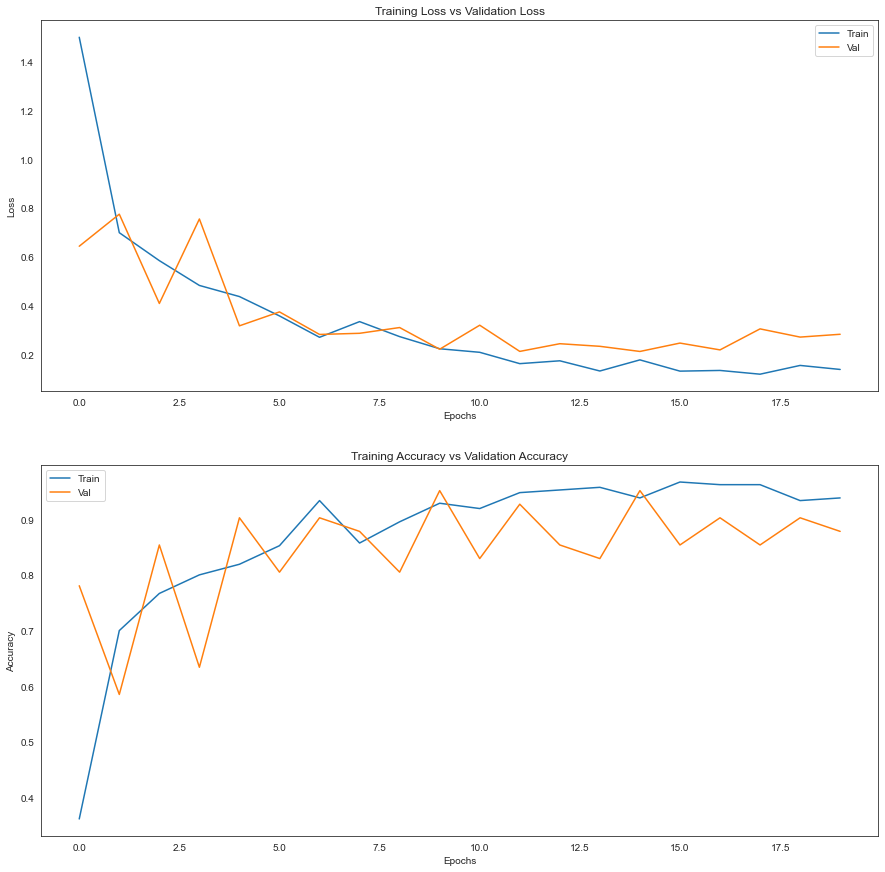

In [59]:
model_pretrain_Xception_aug.__name__='Xception_pretrained_aug'
save_model (model_pretrain_Xception_aug)

sns.set_style('white')
plot_loss_accur (history_pretrain_Xception_aug)

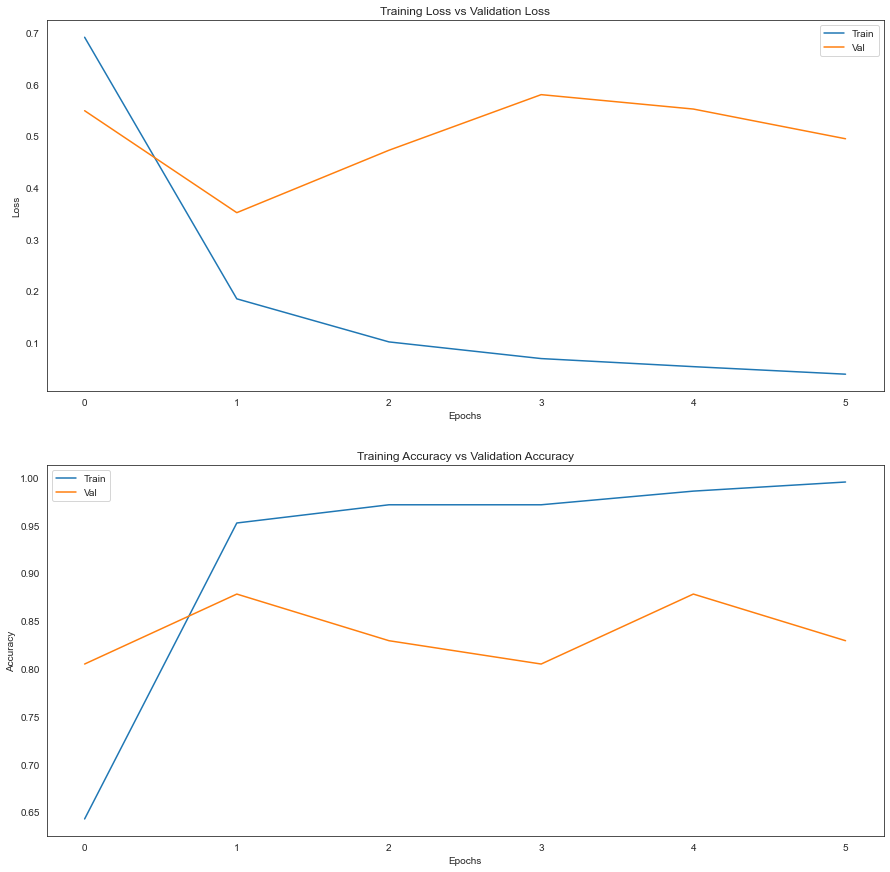

In [146]:
sns.set_style('white')
plot_loss_accur (history_pretrain_Xception)

## Image augmentation and fine tunning

In [157]:
preprocess_input = tf.keras.applications.xception.preprocess_input

base_model =   Xception (weights='imagenet', 
                include_top=False, 
                input_shape=(299, 299, 3))
                
# Freeze the layers the 90% initial layers of the pretrained model. Last 20% trainable!!
y=0
limit = int (0.9 * len(base_model.layers))
for layer in base_model.layers:
    if y <= limit :
        layer.trainable = False
    else: 
        layer.trainable = True
        print (layer)
    y += 1

inputs = tf.keras.Input(shape=(299, 299, 3))



inputs = tf.keras.Input(shape=(299, 299, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = GlobalAveragePooling2D()(x)    
x = keras.layers.Dense(1024, activation='relu')(x)
x = keras.layers.Dropout(0.2)(x)                  
x = keras.layers.Dense(3, activation='softmax')(x)  
model_pretrain_Xception_ft90 = Model(inputs, x)  # model includes data augmentation and last 10% of pretrained model can be trained to fine tunne


In [158]:
base_learning_rate = 0.0001

model_pretrain_Xception_ft90.compile (optimizer = 'adam', 
                                loss = 'sparse_categorical_crossentropy',            
                                metrics=['accuracy'])

In [159]:
callbacks = myCallback() 

initial_epochs = 40

history_pretrain_Xception_ft90 = model_pretrain_Xception_ft90.fit(train_dataset,
                                                        epochs=initial_epochs,                    
                                                        validation_data = validation_dataset,
                                                        callbacks=[callbacks])

Epoch 1/40
7/7 [==============================] - 94s 12s/step - loss: 1.3249 - accuracy: 0.4667 - val_loss: 0.8405 - val_accuracy: 0.5610
Epoch 2/40
7/7 [==============================] - 101s 14s/step - loss: 1.0582 - accuracy: 0.5714 - val_loss: 0.6549 - val_accuracy: 0.6341
Epoch 3/40
7/7 [==============================] - 106s 15s/step - loss: 0.8973 - accuracy: 0.5810 - val_loss: 0.7402 - val_accuracy: 0.5366
Epoch 4/40
7/7 [==============================] - 106s 15s/step - loss: 0.9811 - accuracy: 0.4619 - val_loss: 0.8306 - val_accuracy: 0.5854
Epoch 5/40
7/7 [==============================] - 104s 15s/step - loss: 1.0729 - accuracy: 0.4476 - val_loss: 1.4187 - val_accuracy: 0.3415
Epoch 6/40
7/7 [==============================] - 103s 15s/step - loss: 1.1348 - accuracy: 0.3952 - val_loss: 0.9124 - val_accuracy: 0.4634
Epoch 7/40
7/7 [==============================] - 97s 14s/step - loss: 1.1371 - accuracy: 0.4381 - val_loss: 1.3192 - val_accuracy: 0.3902
Epoch 8/40
7/7 [======

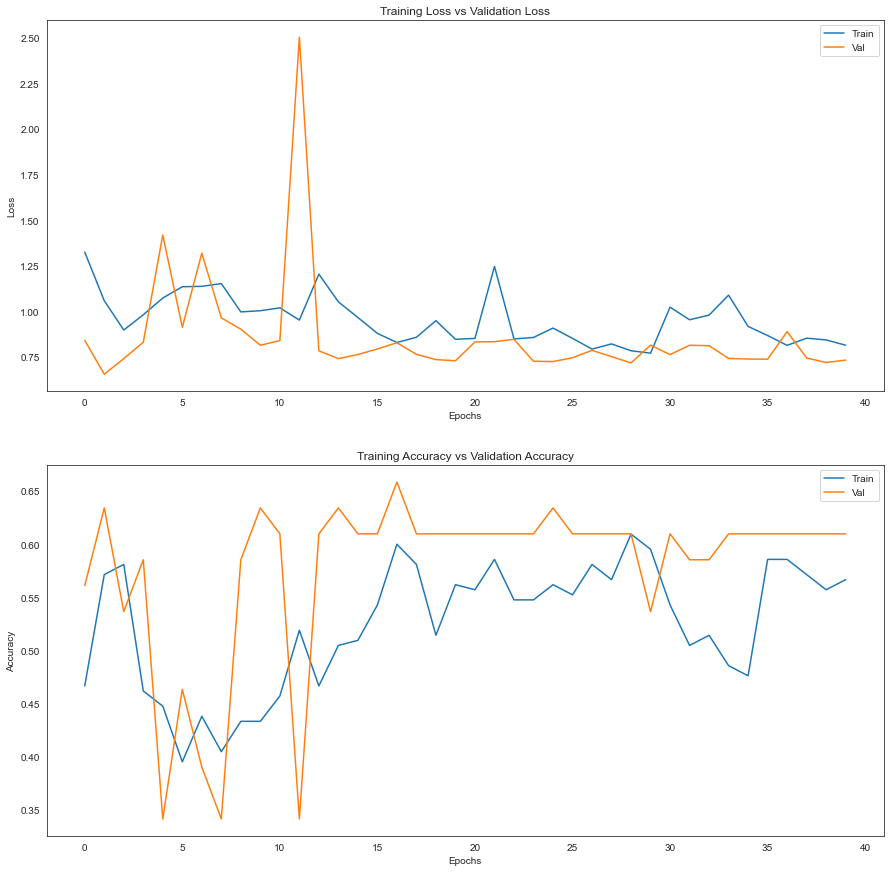

In [160]:
sns.set_style('white')
plot_loss_accur (history_pretrain_Xception_ft90)

In [161]:
preprocess_input = tf.keras.applications.xception.preprocess_input

base_model =   Xception (weights='imagenet', 
                include_top=False, 
                input_shape=(299, 299, 3))
                
# Unfreeze  all the layers of the pretrained model!
limit = int (0.9 * len(base_model.layers))
for layer in base_model.layers:
    layer.trainable = True

inputs = tf.keras.Input(shape=(299, 299, 3))



inputs = tf.keras.Input(shape=(299, 299, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = GlobalAveragePooling2D()(x)    
x = keras.layers.Dense(1024, activation='relu')(x)
x = keras.layers.Dropout(0.2)(x)                  
x = keras.layers.Dense(3, activation='softmax')(x)  
model_pretrain_Xception_unfrzz = Model(inputs, x)  # model includes data augmentation and last 10% of pretrained model can be trained to fine tunne


In [162]:
base_learning_rate = 0.0001

model_pretrain_Xception_unfrzz.compile (optimizer = 'adam', 
                                loss = 'sparse_categorical_crossentropy',            
                                metrics=['accuracy'])

                                

In [ ]:
callbacks = myCallback() 

initial_epochs = 40

history_pretrain_Xception_unfrzz = model_pretrain_Xception_unfrzz.fit(train_dataset,
                                                        epochs=initial_epochs,                    
                                                        validation_data = validation_dataset,
                                                        callbacks=[callbacks])

# FI MODEL XCEPTION

In [40]:
# Generate an array of images resized to be 224x224 pixels, ignoring original aspect ratio
data_224=[]
for img in ImagePaths:
    image = resize_image(img, 224)
    data_224.append(image)
    
# Convert image data to numpy array and standardize values (divide by 255 since RGB values ranges from 0 to 255)
data_224 = np.array(data_224, dtype="float") / 255.0

# Show data shape
print("Shape of whole data: ", data_224.shape)

Shape of whole data:  (182, 224, 224, 3)


In [40]:
      
# Generate an array of images  resized to be 150 x 150 pixels, ignoring original aspect ratio

data_150_train=[]
for img in ImagePaths_train:
    image = resize_image(img, 150)
    data_150_train.append(image)
    
# Convert image data to numpy array and standardize values (divide by 255 since RGB values ranges from 0 to 255)
data_150_train = np.array(data_150_train, dtype="float") / 255.0

# Show data shape
print("Shape of whole data: ", data_150_train.shape)


Shape of whole data:  (210, 150, 150, 3)


In [42]:
# Convert Labels list for train samples to numpy array
LabelsArray_train=np.array(ListLabels_train)

# Encode labels 
enc = OrdinalEncoder()
y=enc.fit_transform(LabelsArray_train.reshape(-1,1))



In [44]:
# Generate an array of images from test/validation resized to be 224x224 pixels, ignoring original aspect ratio
data_t_224_test =[]
for img in ImagePaths_test:
    image = resize_image(img, 224)
    data_t_224_test.append(image)


In [45]:
# Generate an array of images from test/validation resized to be 224x224 pixels, ignoring original aspect ratio
data_t_224=[]
for img in ImagePaths_test:
    image = resize_image(img, 224)
    data_t_224.append(image)
    
# Convert image data to numpy array and standardize values (divide by 255 since RGB values ranges from 0 to 255)
data_t_224 = np.array(data_t_224, dtype="float") / 255.0

# Convert Labels list to numpy array
LabelsArray_test=np.array(ListLabels_test)

# Encode labels 
enc = OrdinalEncoder()
y_test2=enc.fit_transform(LabelsArray_test.reshape(-1,1))
X_test2 = data_t_224



In [47]:
np.unique(y)

array([0., 1., 2.])

In [48]:
# ---- Create training and validating samples ---
X_train, X_val, y_train, y_val = train_test_split(data_224, y, test_size=0.2, random_state=0, stratify=True)
y_train=y_train.reshape(-1,1)
y_val=y_val.reshape(-1,1)

# Print shapes
# Note, model input must have a four-dimensional shape [samples, rows, columns, channels]
print("Shape of X_train: ", X_train.shape)
print("Shape of y_train: ", y_train.shape)
print("Shape of X_val: ", X_val.shape)
print("Shape of y_val: ", y_val.shape)




TypeError: Singleton array array(True) cannot be considered a valid collection.

In [ ]:

# create a list of pretrained models needed to be tested
list_pretrained = [Xception, VGG16, VGG19, ResNet50V2, ResNet101V2, ResNet152V2, InceptionResNetV2, 
MobileNetV2, DenseNet121, DenseNet169, DenseNet201, EfficientNetB0, EfficientNetB4, EfficientNetB7, NASNetLarge]
# initialisation
df_results = pd.DataFrame()
dict_hist  = {}


In [ ]:

# training loop
for model in list_pretrained:
    name = model.__name__     # catch the name of the model
    _hists, _df = pretrained_model_classification(X_train, y_train, X_val, y_val, X_test2, y_test2,
                                    _model=model(weights='imagenet', include_top=False, input_shape=(224, 224, 3)), 
                                    batch_size=32, epochs_num=30, patience=2, num_classes=3)
    
    print(f"Model {name} done with accuracy: {100*_df['acc']}%, precision: {100*_df['prec']}%")

Epoch 1/30


ValueError: in user code:

    File "c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\keras\engine\training.py", line 1051, in train_function  *
        return step_function(self, iterator)
    File "c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\keras\engine\training.py", line 1040, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\keras\engine\training.py", line 1030, in run_step  **
        outputs = model.train_step(data)
    File "c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\keras\engine\training.py", line 890, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\keras\engine\training.py", line 948, in compute_loss
        return self.compiled_loss(
    File "c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\keras\engine\compile_utils.py", line 201, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\keras\losses.py", line 139, in __call__
        losses = call_fn(y_true, y_pred)
    File "c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\keras\losses.py", line 243, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\keras\losses.py", line 1787, in categorical_crossentropy
        return backend.categorical_crossentropy(
    File "c:\Users\march\anaconda3\envs\NeuronalNetwork\lib\site-packages\keras\backend.py", line 5119, in categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)

    ValueError: Shapes (None, 1) and (None, 3, 3, 3) are incompatible


In [ ]:
# ---- Create Alternative training and testing samples: use test samples as validation/test ---
X_train2 = data_224
y_train2 = y
X_test2 =  


 

y_train2=y_train2.reshape(-1,1)
y_test2=y_test2.reshape(-1,1)

# Print shapes
# Note, model input must have a four-dimensional shape [samples, rows, columns, channels]
print("Shape of X_train2: ", X_train2.shape)
print("Shape of y_train2: ", y_train2.shape)
print("Shape of X_test2: ", X_test2.shape)
print("Shape of y_test2: ", y_test2.shape)

Shape of X_train2:  (182, 224, 224, 3)
Shape of y_train2:  (182, 1)
Shape of X_test2:  (41, 224, 224, 3)
Shape of y_test2:  (41, 1)


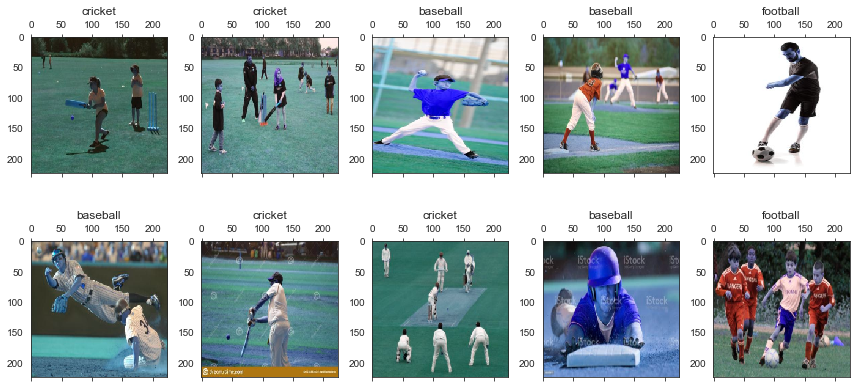

In [ ]:
# Display images of 10 sports in the training set and their true labels
fig, axs = plt.subplots(2, 5, sharey=False, tight_layout=True, figsize=(12,6), facecolor='white')
for i in range(0,2):
    for j in range(0,5):
        n= random.randint(0,X_train2.shape[0]-1) #eleccion imagen aleatoria
        axs[i,j].matshow(X_train2[n])
        axs[i,j].set(title=enc.inverse_transform(y_train2)[n][0])
plt.show() 

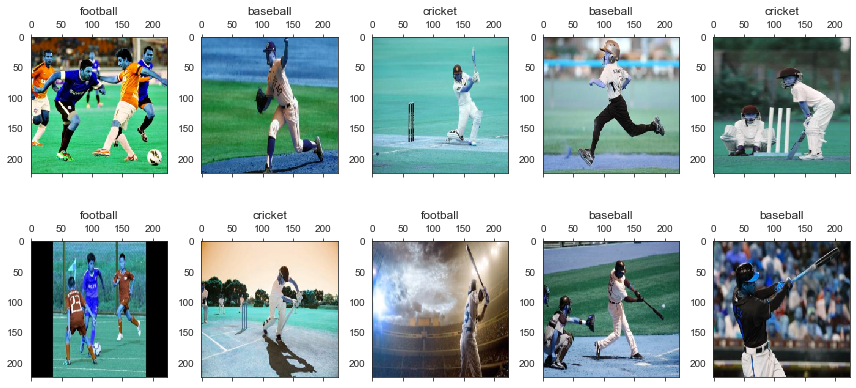

In [ ]:
# Display images of 10 sports in the testing/validation set and their true labels

fig, axs = plt.subplots(2, 5, sharey=False, tight_layout=True, figsize=(12,6), facecolor='white')
for i in range(0,2):
    for j in range(0,5):
        n= random.randint(0,X_test2.shape[0]-1) #eleccion imagen aleatoria
        axs[i,j].matshow(X_test2[n])
        axs[i,j].set(title=enc.inverse_transform(y_test2)[n][0])
        #n=n+1
plt.show() 

## Commom for all models

### Callbacks


In [ ]:
#Callbacks structure for all tested models 
class ASK(keras.callbacks.Callback):
    def __init__ (self, model, epochs,  ask_epoch): # initialization of the callback
        super(ASK, self).__init__()
        self.model=model               
        self.ask_epoch=ask_epoch
        self.epochs=epochs
        self.ask=True # if True query the user on a specified epoch
        
    def on_train_begin(self, logs=None): # this runs on the beginning of training
        if self.ask_epoch == 0: 
            print('you set ask_epoch = 0, ask_epoch will be set to 1', flush=True)
            self.ask_epoch=1
        if self.ask_epoch >= self.epochs: # you are running for epochs but ask_epoch>epochs
            print('ask_epoch >= epochs, will train for ', epochs, ' epochs', flush=True)
            self.ask=False # do not query the user
        if self.epochs == 1:
            self.ask=False # running only for 1 epoch so do not query user
        else:
            print('Training will proceed until epoch', ask_epoch,' then you will be asked to') 
            print(' enter H to halt training or enter an integer for how many more epochs to run then be asked again')  
        self.start_time= time.time() # set the time at which training started
        
    def on_train_end(self, logs=None):   # runs at the end of training     
        tr_duration=time.time() - self.start_time   # determine how long the training cycle lasted         
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))
        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print (msg, flush=True) # print out training duration time
        
    def on_epoch_end(self, epoch, logs=None):  # method runs on the end of each epoch
        if self.ask: # are the conditions right to query the user?
            if epoch + 1 ==self.ask_epoch: # is this epoch the one for quering the user?
                print('\n Enter H to end training or  an integer for the number of additional epochs to run then ask again')
                ans=input()
                
                if ans == 'H' or ans =='h' or ans == '0': # quit training for these conditions
                    print ('you entered ', ans, ' Training halted on epoch ', epoch+1, ' due to user input\n', flush=True)
                    self.model.stop_training = True # halt training
                else: # user wants to continue training
                    self.ask_epoch += int(ans)
                    if self.ask_epoch > self.epochs:
                        print('\nYou specified maximum epochs of as ', self.epochs, ' cannot train for ', self.ask_epoch, flush =True)
                    else:
                        print ('you entered ', ans, ' Training will continue to epoch ', self.ask_epoch, flush=True)




In [ ]:
# Instantiate custom callback and create 2 callbacks to control learning rate and early stop

epochs=40
ask_epoch=10
INIT_LR = 1e-3 #Initial Learning Rate
EPOCHS = 25 #Number of epochs in training
BS = 10 #Training Batch Size


## Inception Pretrained model

In [ ]:
### Split train to validation and train

In [ ]:
data_dir= pathlib.Path(r"C:\Users\march\000 Treball Ju`yter 000\Hackathons\Image_sports_classification\Imágenes-data-science-ii\train")
image_count = len(list(data_dir.glob('*/*.jpg')))
batch_size = 32
img_height = 224
img_width = 224

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 210 files belonging to 3 classes.
Using 168 files for training.
Found 210 files belonging to 3 classes.
Using 42 files for validation.


In [ ]:
pre_trained_model = inception_v3.InceptionV3(input_shape = (224, 224, 3), # Shape of our images
                                include_top = False, # Leave out the last fully connected layer
                                weights = 'imagenet')

In [ ]:
# Flatten the output layer to 1 dimension
x = keras.layers.Flatten()(pre_trained_model.output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = keras.layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = keras.layers.Dropout(0.2)(x)                  
# Add a final sigmoid layer for classification
x = keras.layers.Dense  (3, activation='softmax')(x)           

model_inception_3 = Model( pre_trained_model.input, x) 


In [ ]:
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit
# dummy dataset
X = np.array([[1, 2], [3, 4], [1, 2], [3, 4], [1, 2], [3, 4]])
y = np.array([0, 0, 0, 1, 1, 1])
sss = StratifiedShuffleSplit(n_splits=5, test_size=0.5, random_state=0)
sss.get_n_splits(X, y)

print(sss)

for train_index, test_index in sss.split(X, y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

StratifiedShuffleSplit(n_splits=5, random_state=0, test_size=0.5,
            train_size=None)
TRAIN: [5 2 3] TEST: [4 1 0]
TRAIN: [5 1 4] TEST: [0 2 3]
TRAIN: [5 0 2] TEST: [4 3 1]
TRAIN: [4 1 0] TEST: [2 3 5]
TRAIN: [0 5 1] TEST: [3 4 2]


In [ ]:
opt = Adam(learning_rate=INIT_LR, decay=INIT_LR / EPOCHS)
model_inception_3.compile(optimizer = opt, 
              loss = 'SparseCategoricalCrossentropy', 
              metrics = ['acc'])

In [ ]:
epochs=40

history_Inception3_initial = model_inception_3.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

### Other

Reference: https://github.com/tejanirla/image_classification/blob/master/transfer_learning.ipynb

In [ ]:
pre_trained_model = inception_v3.InceptionV3(input_shape = (224, 224, 3), # Shape of our images
                                include_top = False, # Leave out the last fully connected layer
                                weights = 'imagenet')

In [ ]:
for layer in pre_trained_model.layers:
  layer.trainable = False

In [ ]:
class myCallback(tf.keras.callbacks.Callback):
      def on_epoch_end(self, epoch, logs={}):
        if(logs.get('acc')>0.995):
            print("\nReached 99.9% accuracy so cancelling training!")
            self.model.stop_training = True

In [ ]:
# Flatten the output layer to 1 dimension
x = keras.layers.Flatten()(pre_trained_model.output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = keras.layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = keras.layers.Dropout(0.2)(x)                  
# Add a final sigmoid layer for classification
x = keras.layers.Dense  (3, activation='softmax')(x)           

model_inception = Model( pre_trained_model.input, x) 


In [ ]:

x = keras.layers.AveragePooling2D(pool_size=(4, 4))(pre_trained_model.output)
# Flatten the output layer to 1 dimension
x = keras.layers.Flatten()(x)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = keras.layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = keras.layers.Dropout(0.2)(x)                  
# Add a final sigmoid layer for classification
x = keras.layers.Dense  (3, activation='softmax')(x)           

model_inception2 = Model( pre_trained_model.input, x) 

In [ ]:

model_inception.compile(optimizer = RMSprop(learning_rate=0.0001), 
              loss = 'SparseCategoricalCrossentropy', 
              metrics = ['acc'])

In [ ]:
callbacks = myCallback()
H_model_inception = model_inception.fit(X_train2, # input data
                y_train2, # target data
                batch_size=32, # Number of samples per gradient update. If unspecified, batch_size will default to 32.
                epochs=40, # default=1, Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided
                verbose=2, # default='auto', ('auto', 0, 1, or 2). Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch. 'auto' defaults to 1 for most cases, but 2 when used with ParameterServerStrategy.
                callbacks=[callbacks], # default=None, list of callbacks to apply during training. See tf.keras.callbacks
                validation_split=0, # default=0.0, Fraction of the training data to be used as validation data. The model will set apart this fraction of the training data, will not train on it, and will evaluate the loss and any model metrics on this data at the end of each epoch. 
                validation_data=(X_test2, y_test2), # default=None, Data on which to evaluate the loss and any model metrics at the end of each epoch. 
                shuffle=True, # default=True, Boolean (whether to shuffle the training data before each epoch) or str (for 'batch').
                class_weight=None, # default=None, Optional dictionary mapping class indices (integers) to a weight (float) value, used for weighting the loss function (during training only). This can be useful to tell the model to "pay more attention" to samples from an under-represented class.
                sample_weight=None, # default=None, Optional Numpy array of weights for the training samples, used for weighting the loss function (during training only).
                initial_epoch=0, # Integer, default=0, Epoch at which to start training (useful for resuming a previous training run).
                steps_per_epoch=None, # Integer or None, default=None, Total number of steps (batches of samples) before declaring one epoch finished and starting the next epoch. When training with input tensors such as TensorFlow data tensors, the default None is equal to the number of samples in your dataset divided by the batch size, or 1 if that cannot be determined. 
                validation_steps=None, # Only relevant if validation_data is provided and is a tf.data dataset. Total number of steps (batches of samples) to draw before stopping when performing validation at the end of every epoch.
                validation_batch_size=None, # Integer or None, default=None, Number of samples per validation batch. If unspecified, will default to batch_size.
                validation_freq=1, # default=1, Only relevant if validation data is provided. If an integer, specifies how many training epochs to run before a new validation run is performed, e.g. validation_freq=2 runs validation every 2 epochs.
                max_queue_size=10, # default=10, Used for generator or keras.utils.Sequence input only. Maximum size for the generator queue. If unspecified, max_queue_size will default to 10.
                workers=1, # default=1, Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
                use_multiprocessing=False, # default=False, Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False. 
                )

Epoch 1/40
6/6 - 39s - loss: 22.6746 - acc: 0.3297 - val_loss: 3.6738 - val_acc: 0.4878 - 39s/epoch - 6s/step
Epoch 2/40
6/6 - 28s - loss: 0.8386 - acc: 0.7967 - val_loss: 1.0919 - val_acc: 0.6829 - 28s/epoch - 5s/step
Epoch 3/40
6/6 - 25s - loss: 3.3643 - acc: 0.7088 - val_loss: 3.8892 - val_acc: 0.5122 - 25s/epoch - 4s/step
Epoch 4/40
6/6 - 28s - loss: 0.4883 - acc: 0.9066 - val_loss: 0.9986 - val_acc: 0.7073 - 28s/epoch - 5s/step
Epoch 5/40
6/6 - 29s - loss: 0.0710 - acc: 0.9505 - val_loss: 2.4573 - val_acc: 0.6829 - 29s/epoch - 5s/step
Epoch 6/40
6/6 - 29s - loss: 1.2587 - acc: 0.7582 - val_loss: 1.1978 - val_acc: 0.7073 - 29s/epoch - 5s/step
Epoch 7/40

Reached 99.9% accuracy so cancelling training!
6/6 - 28s - loss: 0.0176 - acc: 1.0000 - val_loss: 1.1766 - val_acc: 0.7317 - 28s/epoch - 5s/step


In [ ]:
save_model (model_inception, 'Inception_m1_initial')

Model saved. Date:  _2022_09_12_20_17


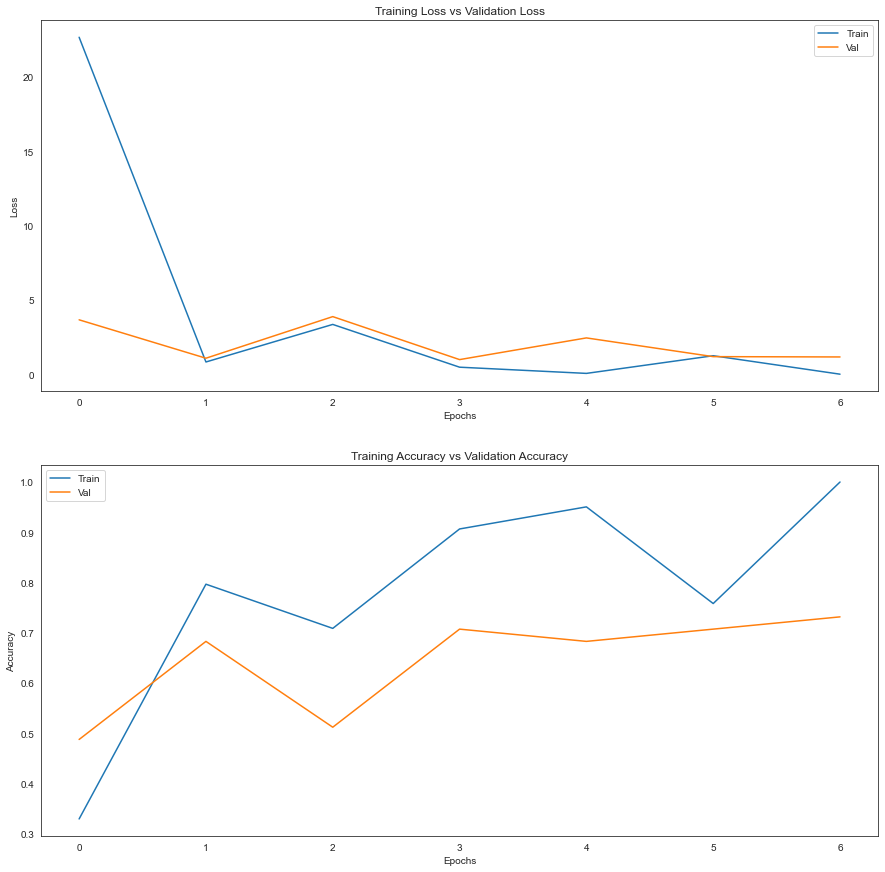

In [ ]:
sns.set_style('white')
plot_loss_accur (H_model_inception)

In [ ]:
# Instantiate custom callback and create 2 callbacks to control learning rate and early stop

epochs=40
ask_epoch=10
INIT_LR = 1e-3 #Initial Learning Rate
EPOCHS = 25 #Number of epochs in training
BS = 10 #Training Batch Size

opt = Adam(learning_rate=INIT_LR, decay=INIT_LR / EPOCHS)
model_inception2.compile(optimizer = opt, 
            loss = 'SparseCategoricalCrossentropy', 
            metrics = ['acc'])

In [ ]:
callbacks = myCallback()
H_model_inception2 = model_inception2.fit(X_train2, # input data
                y_train2, # target data
                batch_size=32, # Number of samples per gradient update. If unspecified, batch_size will default to 32.
                epochs=epochs
                , # default=1, Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided
                verbose=2, # default='auto', ('auto', 0, 1, or 2). Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch. 'auto' defaults to 1 for most cases, but 2 when used with ParameterServerStrategy.
                callbacks=[callbacks], # default=None, list of callbacks to apply during training. See tf.keras.callbacks
                validation_split=0, # default=0.0, Fraction of the training data to be used as validation data. The model will set apart this fraction of the training data, will not train on it, and will evaluate the loss and any model metrics on this data at the end of each epoch. 
                validation_data=(X_test2, y_test2), # default=None, Data on which to evaluate the loss and any model metrics at the end of each epoch. 
                shuffle=True, # default=True, Boolean (whether to shuffle the training data before each epoch) or str (for 'batch').
                class_weight=None, # default=None, Optional dictionary mapping class indices (integers) to a weight (float) value, used for weighting the loss function (during training only). This can be useful to tell the model to "pay more attention" to samples from an under-represented class.
                sample_weight=None, # default=None, Optional Numpy array of weights for the training samples, used for weighting the loss function (during training only).
                initial_epoch=0, # Integer, default=0, Epoch at which to start training (useful for resuming a previous training run).
                steps_per_epoch=None, # Integer or None, default=None, Total number of steps (batches of samples) before declaring one epoch finished and starting the next epoch. When training with input tensors such as TensorFlow data tensors, the default None is equal to the number of samples in your dataset divided by the batch size, or 1 if that cannot be determined. 
                validation_steps=None, # Only relevant if validation_data is provided and is a tf.data dataset. Total number of steps (batches of samples) to draw before stopping when performing validation at the end of every epoch.
                validation_batch_size=None, # Integer or None, default=None, Number of samples per validation batch. If unspecified, will default to batch_size.
                validation_freq=1, # default=1, Only relevant if validation data is provided. If an integer, specifies how many training epochs to run before a new validation run is performed, e.g. validation_freq=2 runs validation every 2 epochs.
                max_queue_size=10, # default=10, Used for generator or keras.utils.Sequence input only. Maximum size for the generator queue. If unspecified, max_queue_size will default to 10.
                workers=1, # default=1, Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
                use_multiprocessing=False, # default=False, Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False. 
                )

Epoch 1/40
6/6 - 29s - loss: 4.4311 - acc: 0.4341 - val_loss: 1.9720 - val_acc: 0.5366 - 29s/epoch - 5s/step
Epoch 2/40
6/6 - 24s - loss: 1.3341 - acc: 0.6044 - val_loss: 0.9816 - val_acc: 0.6098 - 24s/epoch - 4s/step
Epoch 3/40
6/6 - 28s - loss: 0.5994 - acc: 0.7033 - val_loss: 0.6110 - val_acc: 0.7561 - 28s/epoch - 5s/step
Epoch 4/40
6/6 - 29s - loss: 0.3775 - acc: 0.8132 - val_loss: 0.6136 - val_acc: 0.7317 - 29s/epoch - 5s/step
Epoch 5/40
6/6 - 25s - loss: 0.2754 - acc: 0.9121 - val_loss: 0.5885 - val_acc: 0.6829 - 25s/epoch - 4s/step
Epoch 6/40
6/6 - 27s - loss: 0.2228 - acc: 0.9396 - val_loss: 0.5857 - val_acc: 0.6829 - 27s/epoch - 4s/step
Epoch 7/40
6/6 - 25s - loss: 0.1653 - acc: 0.9615 - val_loss: 0.5762 - val_acc: 0.7317 - 25s/epoch - 4s/step
Epoch 8/40
6/6 - 29s - loss: 0.1328 - acc: 0.9780 - val_loss: 0.5676 - val_acc: 0.7805 - 29s/epoch - 5s/step
Epoch 9/40
6/6 - 29s - loss: 0.1005 - acc: 0.9890 - val_loss: 0.5473 - val_acc: 0.7073 - 29s/epoch - 5s/step
Epoch 10/40
6/6 - 3

In [ ]:
save_model (model_inception2, 'Inception_m2_initial')

Model saved. Date:  _2022_09_12_20_23


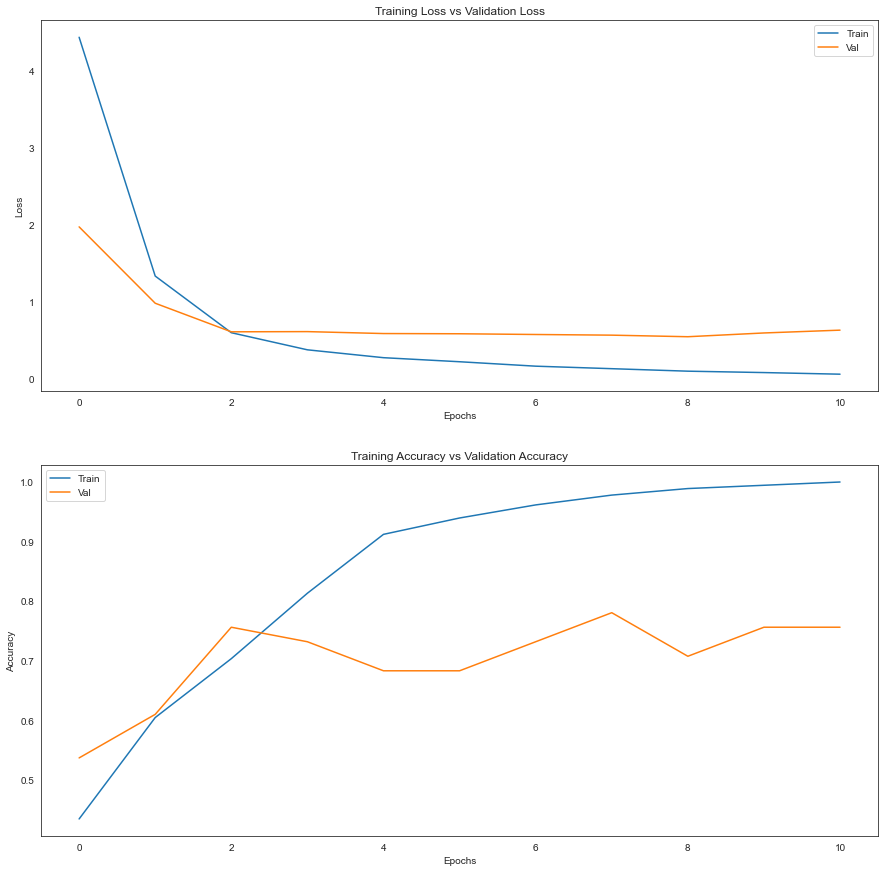

In [ ]:
plot_loss_accur (H_model_inception2)

### Augmented Images

In [ ]:
train_dir = 'C:\\Users\\march\\000 Treball Ju`yter 000\\Hackathons\\Image_sports_classification\\Imágenes-data-science-ii\\train'
validation_dir = 'C:\\Users\\march\\000 Treball Ju`yter 000\\Hackathons\\Image_sports_classification\\Imágenes-data-science-ii\\validation'
# Add our data-augmentation parameters to ImageDataGenerator
train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   rotation_range = 40,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.1,
                                   zoom_range = 0.1,
                                   horizontal_flip = True)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale = 1.0/255. )  

# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    batch_size = 20,
                                                    class_mode = 'binary', 
                                                    target_size = (224, 224))     

# Flow validation images in batches of 20 using test_datagen generator
validation_generator =  test_datagen.flow_from_directory( validation_dir,
                                                          batch_size  = 20,
                                                          class_mode  = 'binary', 
                                                          target_size = (224, 224))

Found 210 images belonging to 3 classes.
Found 41 images belonging to 3 classes.


In [ ]:
# Instantiate custom callback and create 2 callbacks to control learning rate and early stop

epochs=40
ask_epoch=10
INIT_LR = 1e-3 #Initial Learning Rate
EPOCHS = 25 #Number of epochs in training
BS = 10 #Training Batch Size

epochs=40
ask_epoch=10
INIT_LR = 1e-3 #Initial Learning Rate
EPOCHS = 25 #Number of epochs in training
BS = 10 #Training Batch Size


#### Model 1

In [ ]:

opt = Adam(learning_rate=INIT_LR, decay=INIT_LR / EPOCHS)
model_inception.compile(optimizer = opt, 
              loss = 'SparseCategoricalCrossentropy', 
              metrics = ['acc'])


In [ ]:
callbacks = myCallback()
H_model_inception_aug = model_inception.fit(
            train_generator,
            validation_data = validation_generator,
            epochs=40, # default=1, Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided
            verbose=2, # default='auto', ('auto', 0, 1, or 2). Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch. 'auto' defaults to 1 for most cases, but 2 when used with ParameterServerStrategy.
            callbacks=[callbacks], # default=None, list of callbacks to apply during training. See tf.keras.callbacks
            shuffle=True, # default=True, Boolean (whether to shuffle the training data before each epoch) or str (for 'batch').
            initial_epoch=0, # Integer, default=0, Epoch at which to start training (useful for resuming a previous training run).
            steps_per_epoch= 5, # Integer or None, default=None, Total number of steps (batches of samples) before declaring one epoch finished and starting the next epoch. When training with input tensors such as TensorFlow data tensors, the default None is equal to the number of samples in your dataset divided by the batch size, or 1 if that cannot be determined. 
            validation_freq=1, # default=1, Only relevant if validation data is provided. If an integer, specifies how many training epochs to run before a new validation run is performed, e.g. validation_freq=2 runs validation every 2 epochs.
            max_queue_size=10, # default=10, Used for generator or keras.utils.Sequence input only. Maximum size for the generator queue. If unspecified, max_queue_size will default to 10.
            workers=1, # default=1, Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
            use_multiprocessing= False # default=False, Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False. 
                )

Epoch 1/40
5/5 - 23s - loss: 11.4742 - acc: 0.5100 - val_loss: 14.1014 - val_acc: 0.3415 - 23s/epoch - 5s/step
Epoch 2/40
5/5 - 16s - loss: 10.3235 - acc: 0.4900 - val_loss: 4.8136 - val_acc: 0.5366 - 16s/epoch - 3s/step
Epoch 3/40
5/5 - 18s - loss: 5.2413 - acc: 0.5800 - val_loss: 2.8336 - val_acc: 0.6829 - 18s/epoch - 4s/step
Epoch 4/40
5/5 - 19s - loss: 4.6754 - acc: 0.6600 - val_loss: 3.9403 - val_acc: 0.6829 - 19s/epoch - 4s/step
Epoch 5/40
5/5 - 19s - loss: 4.0130 - acc: 0.6556 - val_loss: 3.4065 - val_acc: 0.6585 - 19s/epoch - 4s/step
Epoch 6/40
5/5 - 17s - loss: 3.2799 - acc: 0.7444 - val_loss: 5.2718 - val_acc: 0.6585 - 17s/epoch - 3s/step
Epoch 7/40
5/5 - 19s - loss: 5.2059 - acc: 0.6300 - val_loss: 3.6109 - val_acc: 0.6585 - 19s/epoch - 4s/step
Epoch 8/40
5/5 - 17s - loss: 2.2604 - acc: 0.8000 - val_loss: 1.8319 - val_acc: 0.8049 - 17s/epoch - 3s/step
Epoch 9/40
5/5 - 21s - loss: 3.9176 - acc: 0.6700 - val_loss: 1.8389 - val_acc: 0.8049 - 21s/epoch - 4s/step
Epoch 10/40
5/5 

In [ ]:
save_model (model_inception, 'Inception_m1_augmented')


Model saved. Date:  _2022_09_12_20_38


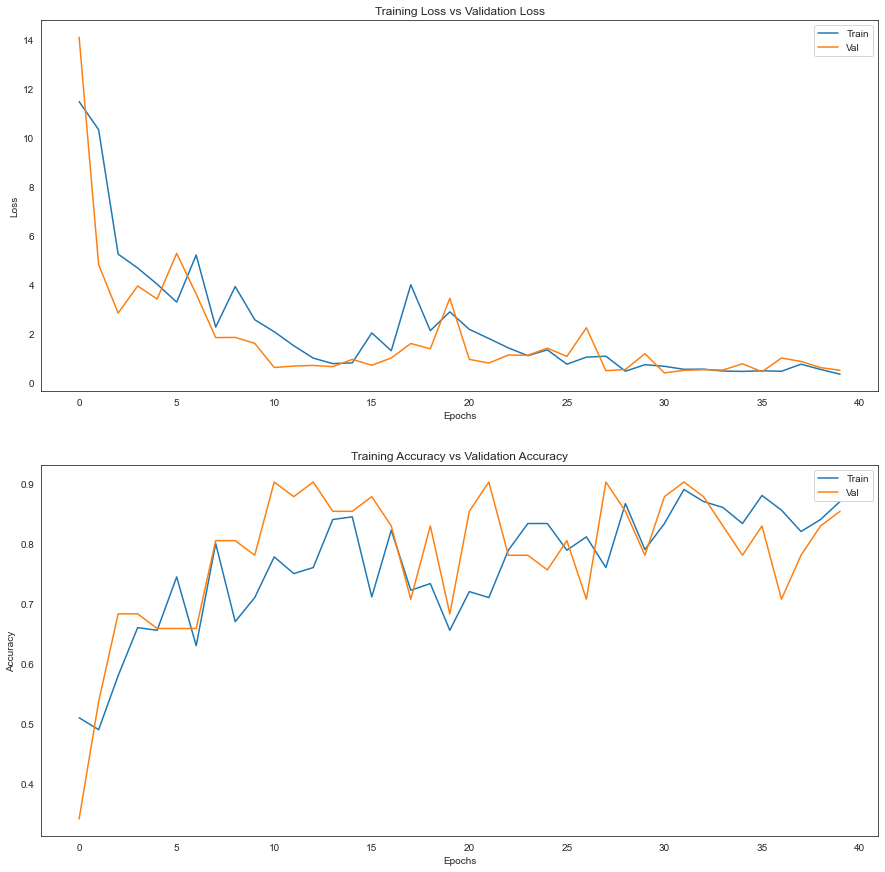

In [ ]:
plot_loss_accur (H_model_inception_aug)

#### Model 2

In [ ]:
opt = Adam(learning_rate=INIT_LR, decay=INIT_LR / EPOCHS)
model_inception2.compile(optimizer = opt, 
              loss = 'SparseCategoricalCrossentropy', 
              metrics = ['acc'])

In [ ]:
callbacks = myCallback()
H_model_inception_aug2 = model_inception2.fit(
            train_generator,
            validation_data = validation_generator,
            epochs=40, # default=1, Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided
            verbose=2, # default='auto', ('auto', 0, 1, or 2). Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch. 'auto' defaults to 1 for most cases, but 2 when used with ParameterServerStrategy.
            callbacks=[callbacks], # default=None, list of callbacks to apply during training. See tf.keras.callbacks
            shuffle=True, # default=True, Boolean (whether to shuffle the training data before each epoch) or str (for 'batch').
            initial_epoch=0, # Integer, default=0, Epoch at which to start training (useful for resuming a previous training run).
            steps_per_epoch= 5, # Integer or None, default=None, Total number of steps (batches of samples) before declaring one epoch finished and starting the next epoch. When training with input tensors such as TensorFlow data tensors, the default None is equal to the number of samples in your dataset divided by the batch size, or 1 if that cannot be determined. 
            validation_freq=1, # default=1, Only relevant if validation data is provided. If an integer, specifies how many training epochs to run before a new validation run is performed, e.g. validation_freq=2 runs validation every 2 epochs.
            max_queue_size=10, # default=10, Used for generator or keras.utils.Sequence input only. Maximum size for the generator queue. If unspecified, max_queue_size will default to 10.
            workers=1, # default=1, Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
            use_multiprocessing= False # default=False, Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False. 
                )

Epoch 1/40
5/5 - 17s - loss: 0.7016 - acc: 0.7556 - val_loss: 0.4679 - val_acc: 0.7805 - 17s/epoch - 3s/step
Epoch 2/40
5/5 - 18s - loss: 0.8227 - acc: 0.6889 - val_loss: 0.6203 - val_acc: 0.7561 - 18s/epoch - 4s/step
Epoch 3/40
5/5 - 18s - loss: 0.5009 - acc: 0.8000 - val_loss: 0.4007 - val_acc: 0.7561 - 18s/epoch - 4s/step
Epoch 4/40
5/5 - 18s - loss: 0.5252 - acc: 0.7778 - val_loss: 0.6508 - val_acc: 0.7317 - 18s/epoch - 4s/step
Epoch 5/40
5/5 - 18s - loss: 0.3587 - acc: 0.8556 - val_loss: 0.4407 - val_acc: 0.7317 - 18s/epoch - 4s/step
Epoch 6/40
5/5 - 18s - loss: 0.4077 - acc: 0.8200 - val_loss: 0.5213 - val_acc: 0.7073 - 18s/epoch - 4s/step
Epoch 7/40
5/5 - 18s - loss: 0.3123 - acc: 0.8900 - val_loss: 0.5561 - val_acc: 0.7317 - 18s/epoch - 4s/step
Epoch 8/40
5/5 - 18s - loss: 0.4026 - acc: 0.8300 - val_loss: 0.4115 - val_acc: 0.8537 - 18s/epoch - 4s/step
Epoch 9/40
5/5 - 19s - loss: 0.4230 - acc: 0.8500 - val_loss: 0.6584 - val_acc: 0.7561 - 19s/epoch - 4s/step
Epoch 10/40
5/5 - 1

In [ ]:
save_model (model_inception2, 'Inception_m2_augmented')

Model saved. Date:  _2022_09_12_20_53


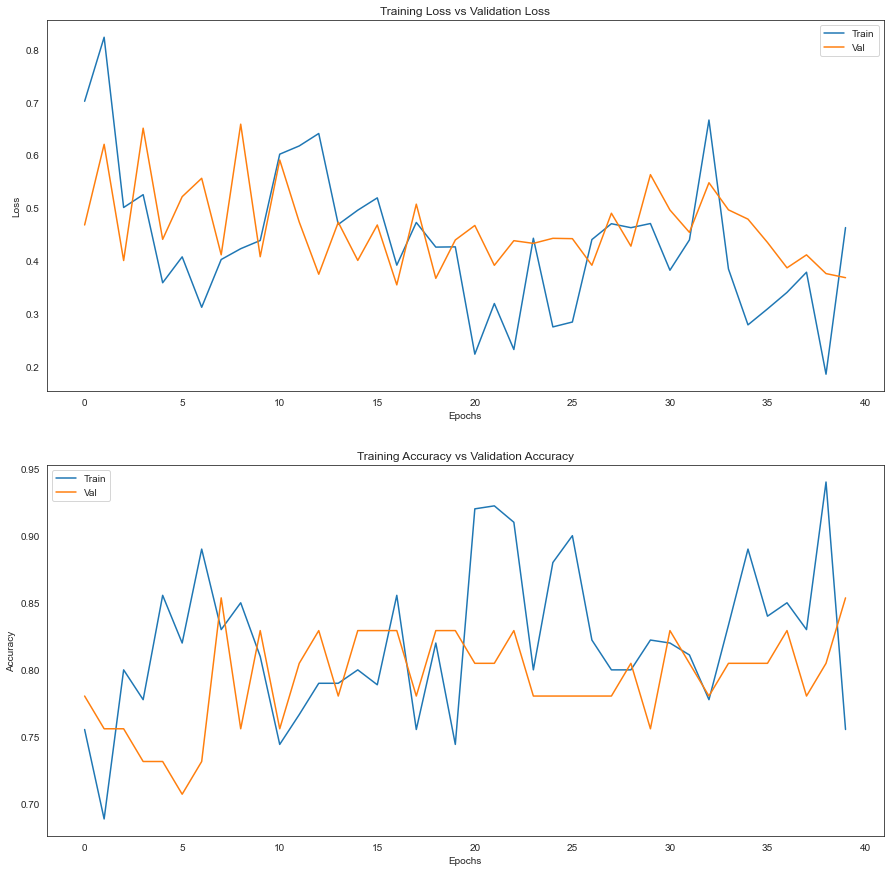

In [ ]:
plot_loss_accur (H_model_inception_aug2)

Accuracy for the validation is higher because no data augmentation has been applied to the validation images.The model is trained with images with higher variability and validation images

# MobilenetV2 model

In [ ]:
pre_trained_model = tf.keras.applications.MobileNetV3Large(input_shape = (224, 224, 3), # Shape of our images
                                include_top = False, # Leave out the last fully connected layer
                                weights = 'imagenet',
                                classifier_activation="softmax",
                                include_preprocessing=True,)

In [ ]:

x = keras.layers.AveragePooling2D(pool_size=(4, 4))(pre_trained_model.output)
# Flatten the output layer to 1 dimension
x = keras.layers.Flatten()(x)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = keras.layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = keras.layers.Dropout(0.2)(x)                  
# Add a final sigmoid layer for classification
x = keras.layers.Dense  (3, activation='sigmoid')(x)           

MobilenetV2_model = Model( pre_trained_model.input, x) 

# model.summary()  # Uncomment this to print a long summary!

In [ ]:
for layer in pre_trained_model.layers:
  layer.trainable = True

In [ ]:
opt = Adam(learning_rate=INIT_LR, decay=INIT_LR / EPOCHS)
MobilenetV2_model.compile(optimizer = opt, 
              loss = 'SparseCategoricalCrossentropy', 
              metrics = ['acc'])

In [ ]:

H_MobilenetV2 = MobilenetV2_model.fit(
            train_generator,
            validation_data = validation_generator,
            epochs=40, # default=1, Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided
            verbose=2, # default='auto', ('auto', 0, 1, or 2). Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch. 'auto' defaults to 1 for most cases, but 2 when used with ParameterServerStrategy.
            callbacks=[callbacks], # default=None, list of callbacks to apply during training. See tf.keras.callbacks
            shuffle=True, # default=True, Boolean (whether to shuffle the training data before each epoch) or str (for 'batch').
            initial_epoch=0, # Integer, default=0, Epoch at which to start training (useful for resuming a previous training run).
            steps_per_epoch= 5, # Integer or None, default=None, Total number of steps (batches of samples) before declaring one epoch finished and starting the next epoch. When training with input tensors such as TensorFlow data tensors, the default None is equal to the number of samples in your dataset divided by the batch size, or 1 if that cannot be determined. 
            validation_freq=1, # default=1, Only relevant if validation data is provided. If an integer, specifies how many training epochs to run before a new validation run is performed, e.g. validation_freq=2 runs validation every 2 epochs.
            max_queue_size=10, # default=10, Used for generator or keras.utils.Sequence input only. Maximum size for the generator queue. If unspecified, max_queue_size will default to 10.
            workers=1, # default=1, Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
            use_multiprocessing= False # default=False, Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False. 
                )

Epoch 1/40
5/5 - 27s - loss: 2.1714 - acc: 0.2900 - val_loss: 1.1445 - val_acc: 0.3171 - 27s/epoch - 5s/step
Epoch 2/40
5/5 - 15s - loss: 1.0160 - acc: 0.5444 - val_loss: 1.1555 - val_acc: 0.3415 - 15s/epoch - 3s/step
Epoch 3/40
5/5 - 16s - loss: 0.9369 - acc: 0.5600 - val_loss: 1.2093 - val_acc: 0.3171 - 16s/epoch - 3s/step
Epoch 4/40
5/5 - 17s - loss: 0.6659 - acc: 0.7600 - val_loss: 1.3445 - val_acc: 0.3171 - 17s/epoch - 3s/step
Epoch 5/40
5/5 - 15s - loss: 0.6377 - acc: 0.7556 - val_loss: 1.5334 - val_acc: 0.3171 - 15s/epoch - 3s/step
Epoch 6/40
5/5 - 16s - loss: 0.4832 - acc: 0.8100 - val_loss: 2.0324 - val_acc: 0.3171 - 16s/epoch - 3s/step
Epoch 7/40
5/5 - 16s - loss: 0.3767 - acc: 0.8500 - val_loss: 3.0324 - val_acc: 0.3171 - 16s/epoch - 3s/step
Epoch 8/40
5/5 - 16s - loss: 0.3116 - acc: 0.9000 - val_loss: 3.1693 - val_acc: 0.3171 - 16s/epoch - 3s/step
Epoch 9/40
5/5 - 18s - loss: 0.3703 - acc: 0.8700 - val_loss: 3.5968 - val_acc: 0.3171 - 18s/epoch - 4s/step
Epoch 10/40
5/5 - 1

# Resnet 

In [ ]:
base_model = tf.keras.applications.ResNet152(weights = 'imagenet', include_top = False, input_shape = (224,224,3))
for layer in base_model.layers:
  layer.trainable = False

In [ ]:


#x = keras.layers.AveragePooling2D(pool_size=(4, 4))(base_model.output)
# Flatten the output layer to 1 dimension
x = keras.layers.Flatten()(base_model.output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = keras.layers.Dense(1200, activation='relu')(x)
# Add a dropout rate of 0.2
x = keras.layers.Dropout(0.2)(x)                  
# Add a final sigmoid layer for classification
x = keras.layers.Dense  (3, activation='sigmoid')(x)           

ResNet152_model = Model( base_model.input, x) 

# model.summary()  # Uncomment this to print a long summary!

In [ ]:
opt = Adam(learning_rate=INIT_LR, decay=INIT_LR / EPOCHS)
ResNet152_model.compile(optimizer = opt, 
              loss = 'SparseCategoricalCrossentropy', 
              metrics = ['acc'])

In [ ]:
H_ResNet152_model = ResNet152_model.fit(
            train_generator,
            batch_size=64, 
            validation_data = validation_generator,
            epochs=30, # default=1, Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided
            verbose=2, # default='auto', ('auto', 0, 1, or 2). Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch. 'auto' defaults to 1 for most cases, but 2 when used with ParameterServerStrategy.
            callbacks=[callbacks], # default=None, list of callbacks to apply during training. See tf.keras.callbacks
            shuffle=True, # default=True, Boolean (whether to shuffle the training data before each epoch) or str (for 'batch').
            initial_epoch=0, # Integer, default=0, Epoch at which to start training (useful for resuming a previous training run).
            steps_per_epoch= 5, # Integer or None, default=None, Total number of steps (batches of samples) before declaring one epoch finished and starting the next epoch. When training with input tensors such as TensorFlow data tensors, the default None is equal to the number of samples in your dataset divided by the batch size, or 1 if that cannot be determined. 
            validation_freq=1, # default=1, Only relevant if validation data is provided. If an integer, specifies how many training epochs to run before a new validation run is performed, e.g. validation_freq=2 runs validation every 2 epochs.
            max_queue_size=10, # default=10, Used for generator or keras.utils.Sequence input only. Maximum size for the generator queue. If unspecified, max_queue_size will default to 10.
            workers=1, # default=1, Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
            use_multiprocessing= False # default=False, Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False. 
                )

RuntimeError: You must compile your model before training/testing. Use `model.compile(optimizer, loss)`.

# Googlenet

In [ ]:
def inception(x,
              filters_1x1,
              filters_3x3_reduce,
              filters_3x3,
              filters_5x5_reduce,
              filters_5x5,
              filters_pool):
  path1 = keras.layers.Conv2D(filters_1x1, (1, 1), padding='same',    activation='relu')(x)
  path2 = keras.layers.Conv2D(filters_3x3_reduce, (1, 1), padding='same', activation='relu')(x)
  path2 = keras.layers.Conv2D(filters_3x3, (1, 1), padding='same', activation='relu')(path2)
  path3 = keras.layers.Conv2D(filters_5x5_reduce, (1, 1), padding='same', activation='relu')(x)
  path3 = keras.layers.Conv2D(filters_5x5, (1, 1), padding='same', activation='relu')(path3)
  path4 = keras.layers.MaxPool2D((3, 3), strides=(1, 1), padding='same')(x)
  path4 = keras.layers.Conv2D(filters_pool, (1, 1), padding='same', activation='relu')(path4)
  return tf.concat([path1, path2, path3, path4], axis=3)

In [ ]:
inp = keras.layers.Input(shape=(224, 224, 3))
input_tensor = keras.layers.experimental.preprocessing.Resizing(224, 224, interpolation="bilinear")(inp)
x = keras.layers.Conv2D(64, 7, strides=2, padding='same', activation='relu')(input_tensor)
x = keras.layers.MaxPooling2D(3, strides=2)(x)
x = keras.layers.Conv2D(64, 1, strides=1, padding='same', activation='relu')(x)
x = keras.layers.Conv2D(192, 3, strides=1, padding='same', activation='relu')(x)
x = keras.layers.MaxPooling2D(3, strides=2)(x)
x = inception(x, filters_1x1=64, filters_3x3_reduce=96, filters_3x3=128, filters_5x5_reduce=16, filters_5x5=32, filters_pool=32)
x = inception(x, filters_1x1=128, filters_3x3_reduce=128, filters_3x3=192, filters_5x5_reduce=32, filters_5x5=96, filters_pool=64)
x = keras.layers.MaxPooling2D(3, strides=2)(x)
x = inception(x, filters_1x1=192, filters_3x3_reduce=96, filters_3x3=208, filters_5x5_reduce=16, filters_5x5=48, filters_pool=64)
aux1 = keras.layers.AveragePooling2D((5, 5), strides=3)(x)
aux1 =keras.layers.Conv2D(128, 1, padding='same', activation='relu')(aux1)
aux1 = keras.layers.Flatten()(aux1)
aux1 = keras.layers.Dense(1024, activation='relu')(aux1)
aux1 = keras.layers.Dropout(0.7)(aux1)
aux1 = keras.layers.Dense(10, activation='softmax')(aux1)
x = inception(x, filters_1x1=160, filters_3x3_reduce=112, filters_3x3=224, filters_5x5_reduce=24, filters_5x5=64, filters_pool=64)
x = inception(x, filters_1x1=128, filters_3x3_reduce=128, filters_3x3=256, filters_5x5_reduce=24, filters_5x5=64, filters_pool=64)
x = inception(x, filters_1x1=112, filters_3x3_reduce=144, filters_3x3=288, filters_5x5_reduce=32, filters_5x5=64, filters_pool=64)
aux2 = keras.layers.AveragePooling2D((5, 5), strides=3)(x)
aux2 =keras.layers.Conv2D(128, 1, padding='same', activation='relu')(aux2)
aux2 = keras.layers.Flatten()(aux2)
aux2 = keras.layers.Dense(1024, activation='relu')(aux2)
aux2 = keras.layers.Dropout(0.7)(aux2) 
aux2 = keras.layers.Dense(10, activation='softmax')(aux2)
x = inception(x, filters_1x1=256, filters_3x3_reduce=160, filters_3x3=320, filters_5x5_reduce=32, filters_5x5=128, filters_pool=128)
x = keras.layers.MaxPooling2D(3, strides=2)(x)
x = inception(x, filters_1x1=256, filters_3x3_reduce=160, filters_3x3=320, filters_5x5_reduce=32, filters_5x5=128, filters_pool=128)
x = inception(x, filters_1x1=384, filters_3x3_reduce=192, filters_3x3=384, filters_5x5_reduce=48, filters_5x5=128, filters_pool=128)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.4)(x)
out = keras.layers.Dense(3, activation='softmax')(x)

model_Googlenet = Model(inputs = inp, outputs = [out, aux1, aux2])

In [ ]:

model_Googlenet.compile(optimizer='adam', 
              loss=['SparseCategoricalCrossentropy',
                    'SparseCategoricalCrossentropy',
                    'SparseCategoricalCrossentropy'],
              loss_weights=[1, 0.3, 0.3],
              metrics=['accuracy'])

In [ ]:
H_model_Googlenet  = model_Googlenet .fit(X_train2, [y_train2, y_train2, y_train2], 
                    validation_data=(X_test2, [y_test2, y_test2, y_test2]), 
                    batch_size=64, 
                    epochs=40,
                    verbose = 2)

Epoch 1/40
3/3 - 58s - loss: 2.3551 - dense_38_loss: 1.0931 - dense_35_loss: 2.1221 - dense_37_loss: 2.0846 - dense_38_accuracy: 0.3681 - dense_35_accuracy: 0.2637 - dense_37_accuracy: 0.2637 - val_loss: 1.9522 - val_dense_38_loss: 1.2343 - val_dense_35_loss: 1.2122 - val_dense_37_loss: 1.1809 - val_dense_38_accuracy: 0.3659 - val_dense_35_accuracy: 0.3659 - val_dense_37_accuracy: 0.3659 - 58s/epoch - 19s/step
Epoch 2/40
3/3 - 29s - loss: 1.8597 - dense_38_loss: 1.1226 - dense_35_loss: 1.2089 - dense_37_loss: 1.2481 - dense_38_accuracy: 0.3901 - dense_35_accuracy: 0.3846 - dense_37_accuracy: 0.3297 - val_loss: 1.7790 - val_dense_38_loss: 1.1071 - val_dense_35_loss: 1.1097 - val_dense_37_loss: 1.1298 - val_dense_38_accuracy: 0.2927 - val_dense_35_accuracy: 0.3171 - val_dense_37_accuracy: 0.2927 - 29s/epoch - 10s/step
Epoch 3/40
3/3 - 23s - loss: 1.8095 - dense_38_loss: 1.0985 - dense_35_loss: 1.1858 - dense_37_loss: 1.1843 - dense_38_accuracy: 0.3132 - dense_35_accuracy: 0.3681 - dense_

In [ ]:
# .history[1]

print(H_model_Googlenet.history.keys())

dict_keys(['loss', 'dense_38_loss', 'dense_35_loss', 'dense_37_loss', 'dense_38_accuracy', 'dense_35_accuracy', 'dense_37_accuracy', 'val_loss', 'val_dense_38_loss', 'val_dense_35_loss', 'val_dense_37_loss', 'val_dense_38_accuracy', 'val_dense_35_accuracy', 'val_dense_37_accuracy'])


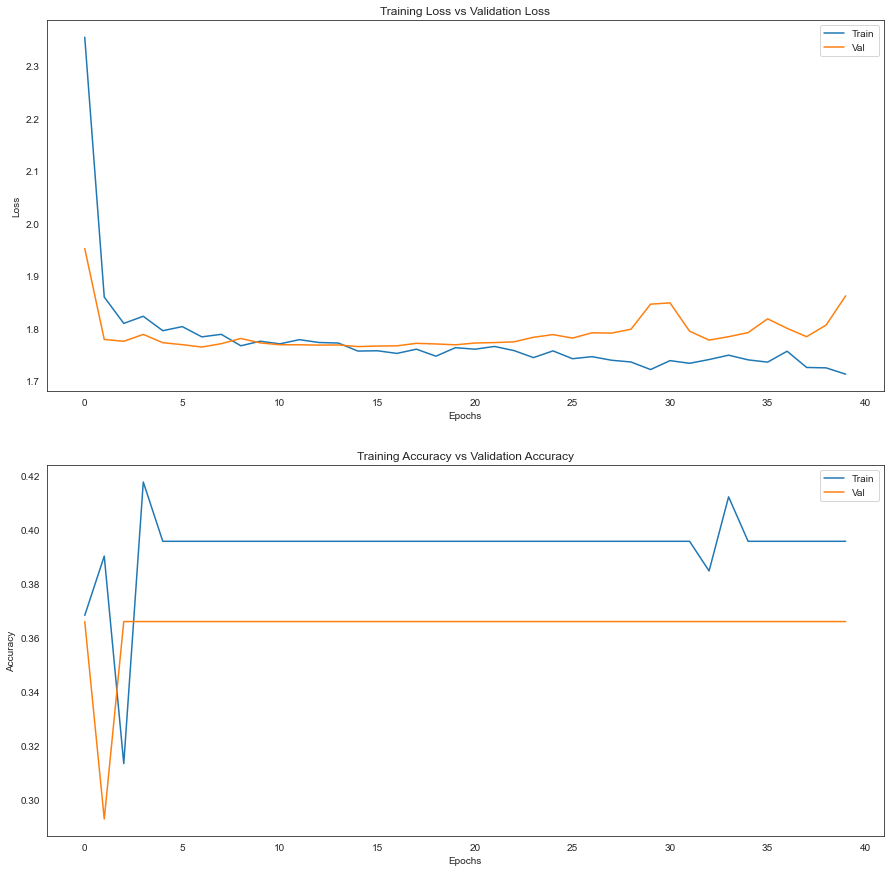

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(15,15))

axs[0].plot(H_model_Googlenet.history['loss'])
axs[0].plot(H_model_Googlenet.history['val_loss'])
axs[0].title.set_text('Training Loss vs Validation Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].legend(['Train','Val'])

axs[1].plot(H_model_Googlenet.history['dense_38_accuracy'])
axs[1].plot(H_model_Googlenet.history['val_dense_38_accuracy'])
axs[1].title.set_text('Training Accuracy vs Validation Accuracy')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Accuracy')
axs[1].legend(['Train', 'Val'])

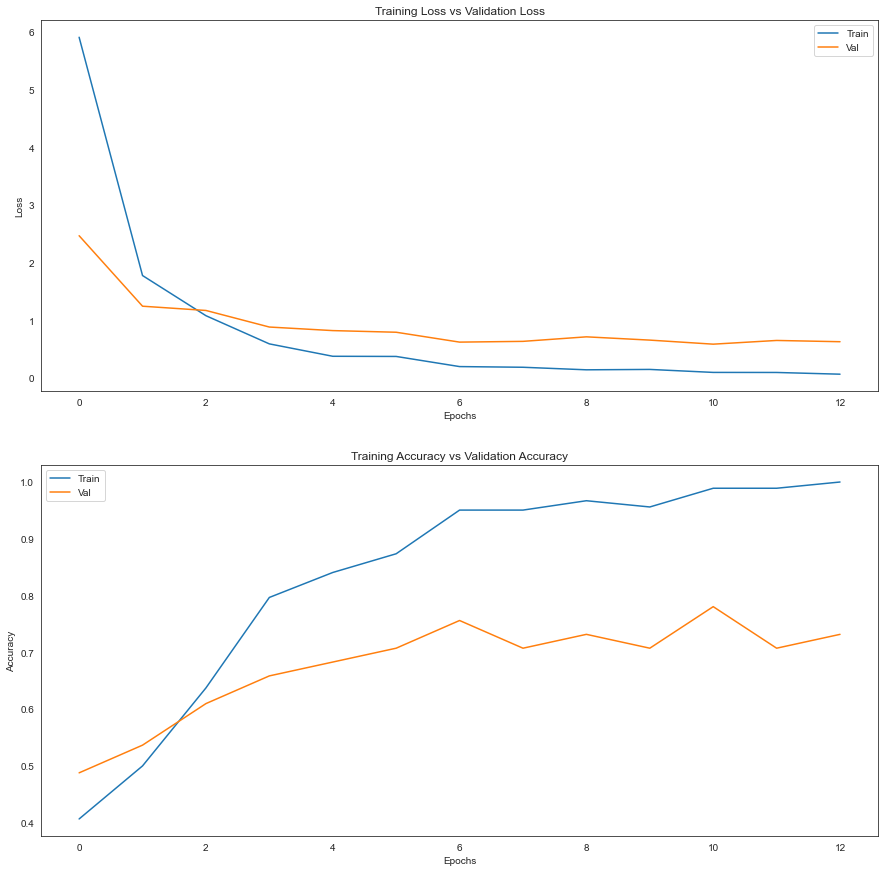

In [ ]:
plot_loss_accur (H_model_inception2)

In [ ]:


def plot_loss_accur (history_model):

    fig, axs = plt.subplots(2, 1, figsize=(15,15))

    axs[0].plot(history_model.history['loss'])
    axs[0].plot(history_model.history['val_loss'])
    axs[0].title.set_text('Training Loss vs Validation Loss')
    axs[0].set_xlabel('Epochs')
    axs[0].set_ylabel('Loss')
    axs[0].legend(['Train','Val'])

    axs[1].plot(history_model.history['dense_38_accuracy'])
    axs[1].plot(history_model.history['val_dense_38_accuracy'])
    axs[1].title.set_text('Training Accuracy vs Validation Accuracy')
    axs[1].set_xlabel('Epochs')
    axs[1].set_ylabel('Accuracy')
    axs[1].legend(['Train', 'Val'])

# Predicitons

Let's get test data in the appropiate format (299 x 299 pixels)

In [29]:
# Test dataset

labels = os.listdir(path_test)
x_test = []
y_test = []
for label in labels:
    x_, y_ = prepare_dataset(os.path.join(path_test, label), label, 299)
    x_test.extend(x_)
    y_test.extend(y_)
x_test = np.array(x_test)
y_test = np.array(y_test)

# create the label encoder
encoder = LabelEncoder()

# encode labels to numbers
test_y  = encoder.fit_transform(y_test)

100%|██████████| 14/14 [00:00<00:00, 275.25it/s]


In [342]:
test_path = 'C:\\Users\\march\\000 Treball Ju`yter 000\\Hackathons\\imag_recognition\\test'


In [343]:
CNN_model = load_model_and_weights('Xception_pretrained_aug')

predictions =[]
list_images =[]
true_labels =[]
for image_name in os.listdir(test_path):
    image_test_path = test_path + '\\'+ image_name
    image_test = tf.keras.utils.load_img(image_test_path, 
                                        target_size=(299, 299))
    img_array = tf.keras.utils.img_to_array(image_test)
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    predictions.append(CNN_model.predict (img_array))
    img1 = cv2.imread(image_test_path) 
    cv2.imshow('HORIZONTAL', img1)

    cv2.waitKey(3)     
    a =input ('\n\n  0: baseball / 1: cricket / 2: football')
    true_labels.append(a)
    list_images.append(image_test_path) 
    cv2.destroyAllWindows()



Model loaded from PC
1/1 [==============================] - 0s 470ms/step


In [344]:
true_labels = [int (x)  for x in true_labels]
zipped = list(zip(list_images, true_labels))
df_true_labels = pd.DataFrame(zipped, columns=['path', 'true_label'])
df_true_labels.to_csv('true_labels_test.csv')


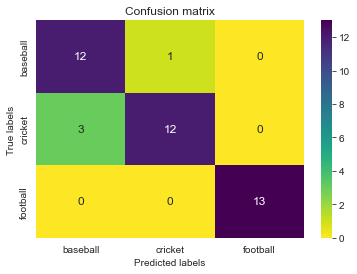

In [345]:
class_sport = ['baseball', 'cricket','football']
label_real_num = true_labels
label_predicted_num = [ x.argmax() for x in predictions]

label_predicted = [ class_sport [x.argmax()] for x in predictions]
label_real = [ class_sport [x] for x in true_labels]

sns.set_style ('white')
confusion_matrix_predictions (label_real_num, label_predicted_num, class_sport)
report_metrics = report_df(label_real, label_predicted)





From the correlation matrix, it can be observed that the missclassified images are between cricket and baseball. Let's check which images are wrongly classified:

In [67]:
j = 0 
missclassified_images=[]
for i in os.listdir(test_path):
    image_test_path = test_path + '\\'+ i
    if label_real_num [j] != label_predicted_num  [j]:
         missclassified_images.append(j)
    j += 1

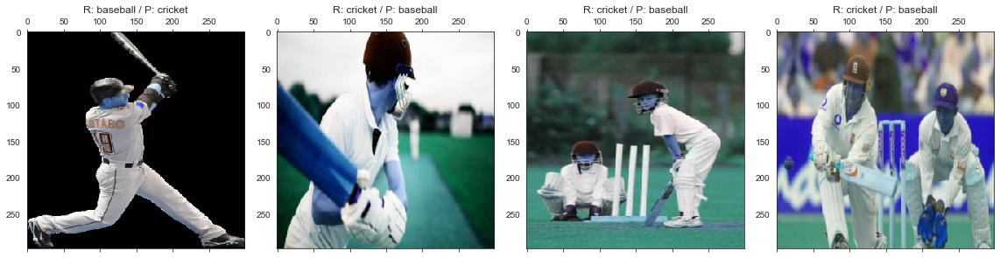

In [72]:
# Display misspredicted testing images with the real label (R) and the predicted one (P):
fig, axs = plt.subplots(1, 4, sharey=False, tight_layout=True, figsize=(32,16), facecolor='white')
fig.set_size_inches(16,4)
n=0
for j in range(0,4):
    position = missclassified_images[n]   
    imgage_wrong = resize_image (list_images[position], 299)
    imgage_wrong = np.array(imgage_wrong)
    axs[j].matshow(imgage_wrong)
    axs[j].set(title= 'R: '+ label_real[position]+  ' / P: '+ label_predicted [position])
    n=n+1
plt.show() 

In [73]:
report_metrics

,precision,recall,f1-score,support
baseball,0.800000,0.923077,0.857143,13.000000
cricket,0.923077,0.800000,0.857143,15.000000
football,1.000000,1.000000,1.000000,13.000000
accuracy,0.902439,0.902439,0.902439,0.902439
macro avg,0.907692,0.907692,0.904762,41.000000
weighted avg,0.908443,0.902439,0.902439,41.000000


In [79]:
print (f'The final CNN model classified test images with a f1 score macro of {round (report_metrics.loc["macro avg","f1-score" ],3)}')

The final CNN model classified test images with a f1 score macro of 0.905



https://stackoverflow.com/questions/43469281/how-to-predict-input-image-using-trained-model-in-keras

If someone is still struggling to make predictions on images, here is the optimized code to load the saved model and make predictions:


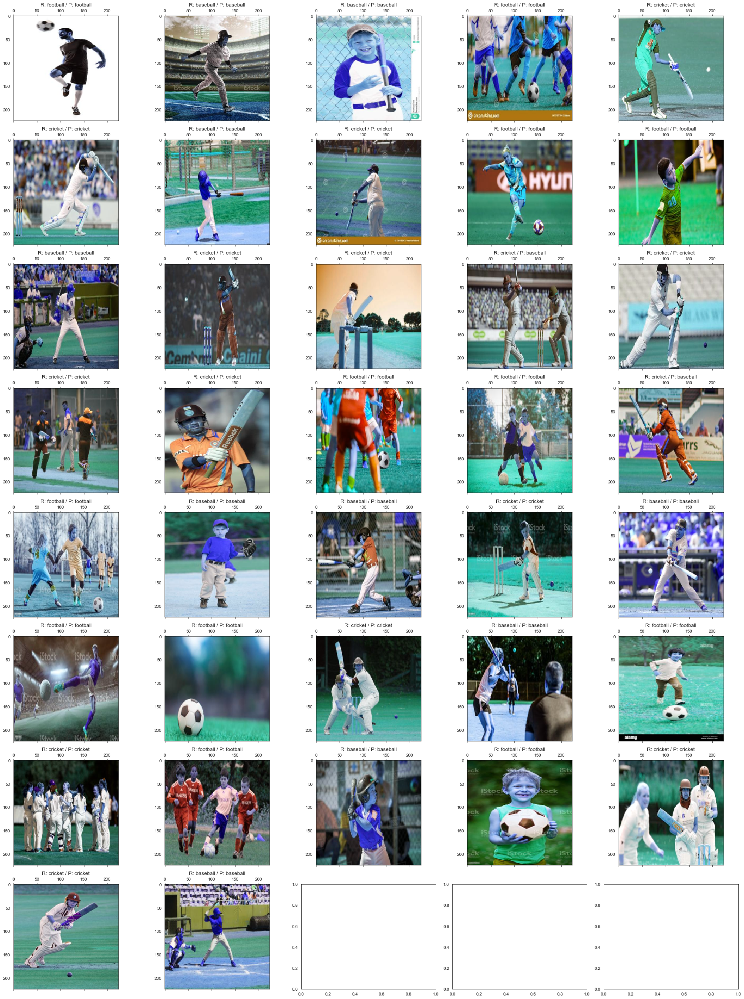

In [272]:
# Display testing images with the real label (R) and the predicted one (P):
fig, axs = plt.subplots(8, 5, sharey=False, tight_layout=True, figsize=(32,16), facecolor='white')
fig.set_size_inches(24,32)
n=0
for i in range(0,8):
    for j in range(0,5):
        if  (i < 7) or (i==7 and j<2):
            axs[i,j].matshow(X_test[n])
            axs[i,j].set(title= 'R: '+label_real[n]+  ' / P: '+label_predicted [n])
            n=n+1
plt.show() 

# New Image implementation with web scrapping

To improve training of the model new images will be scrapped form the internet with the python library  __bing_image_downloader__ performing searches with key words as: 'baseball field', 'cricket field', 'football field',  .

In [23]:
new_img_dir = save_dir + '\\' + 'new_images'
class_sport = ['baseball', 'cricket','football']
for word1 in class_sport:
    for word2 in ['player', 'field', 'ball', 'match']:
        full_search = word1 + ' ' + word2
        downloader.download(full_search, limit = 50,  output_dir = new_img_dir, adult_filter_off=True, force_replace=False, timeout=60, verbose=True)

[%] Downloading Images to c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\baseball player


[!!]Indexing page: 1

[%] Indexed 8 Images on Page 1.


[%] Downloading Image #1 from https://www.cleveland.com/resizer/2vK5TFYdd0b1ptDa1Aszm-76ghg=/1280x0/smart/advancelocal-adapter-image-uploads.s3.amazonaws.com/image.cleveland.com/home/cleve-media/width2048/img/hs/photo/john-martillottajpg-8e7d84e7564bb39d.jpg
[%] File Downloaded !

[%] Downloading Image #2 from http://www.bigdonsboys.com/football/brandon_hancock/main_icon.jpg
[%] File Downloaded !

[%] Downloading Image #3 from https://townsquare.media/site/88/files/2014/04/475279535.jpg?w=1200&amp;h=0&amp;zc=1&amp;s=0&amp;a=t&amp;q=89
[%] File Downloaded !

[%] Downloading Image #4 from https://flashbak.com/wp-content/uploads/2014/05/afro-2.jpg
[%] File Downloaded !

[%] Downloading Image #5 from https://www.stutteringhelp.org/sites/default/files/pictures/BoJackson_June2015.jpg
[%] File Downloaded !

[%]

KeyboardInterrupt: 

In [24]:
# Let's extract more particular images that I found personally useful to classify this 3 different sports
for key_word in ['baseball stick glove', 'cricket stumps glove', 'football goal']:
    downloader.download(key_word, limit = 50,  output_dir = new_img_dir, adult_filter_off=True, force_replace=False, timeout=60, verbose=True)


[%] Downloading Images to c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\baseball stick glove


[!!]Indexing page: 1

[%] Indexed 18 Images on Page 1.


[%] Downloading Image #1 from https://media1.cgtrader.com/variants/ZjW1YTk4WzxMGjgkAsLZLLvF/40073f86dea5cc27b3e46b911284f10ff35833da74046da55f55f229c8993de7/74.jpg
[%] File Downloaded !

[%] Downloading Image #2 from https://media1.cgtrader.com/variants/h3654VCjvXia6UThzyamCAhk/40073f86dea5cc27b3e46b911284f10ff35833da74046da55f55f229c8993de7/86.jpg
[%] File Downloaded !

[%] Downloading Image #3 from https://media.cgtrader.com/variants/LFsEY6t7EHjqsS6rC4DweQTC/40073f86dea5cc27b3e46b911284f10ff35833da74046da55f55f229c8993de7/76.jpg
[%] File Downloaded !

[%] Downloading Image #4 from https://i.pinimg.com/originals/57/ca/0e/57ca0ec6cd0896a05dfb9299bfd399e8.jpg
[%] File Downloaded !

[%] Downloading Image #5 from https://images.stockfreeimages.com/770/sfixl/7709658.jpg
[%] File Downloaded !

[%] Downl

In less than 13 minutes, 750 images were downloaded to the pc. Unfortunatelly images have to be validated as representatives of the corresponding sport. Furthermore, dupplicated pictures or files that can not be opened should be removed. Accordingly, next steps will be taken:
    1. Change format of pictures to .jpg
    2. Check for dupplicates and delete them
    3. Check for convenience of images to be training images (subjective checking).

## Image validation

### Image open check and format change to jpg

In [25]:
new_img_lst = []
for i in os.listdir(new_img_dir):
    path = os.path.join (new_img_dir, i)
    for j in os.listdir(path):
        img_path = os.path.join (path, j)        
        if img_path.split('.')[1] != 'jpg':
            try:
                new_name = img_path.split('.')[0]+'.jpg'
                to_jpg_converter(path, j)
                new_img_lst.append (os.path.join (path, new_name))
            except:
                print (f'Problems with file:\n {img_path}\n It was deleted. \n')
                os.remove (img_path)
        else:
            new_img_lst.append (img_path)

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\baseball ball\Image_19.jpeg
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\baseball ball\Image_21.png
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\baseball ball\Image_24.png
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\baseball ball\Image_25.jpeg
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\baseball ball\Image_27.jpeg
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\baseball ball\Image_31.gif
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recogniti

In [26]:
len (new_img_lst)

562

It was not able to open or transform 88 pictures to the jpg format and they were deleted.

### Duplicates search and removal

In [28]:
def image_features (img_path):
    '''function to extract metadata from image files: size of file and its shape (pixels, color channels)
            INPUT: image path
            OUTPUT: integer for the size of the file as bites and the shape of the image as a list'''       
    img_file_size = os.path.getsize(img_path)
    shape = mpimg.imread(img_path).shape
    return img_file_size, shape 

In [29]:
size_list, shape_list = [], []
for i in new_img_lst:
    size, shape = image_features(i)
    size_list.append(size)
    shape_list.append(shape)

zipped = list(zip(new_img_lst, size_list , shape_list))
df_new_img = pd.DataFrame(zipped, columns=['path', 'size','shape'])



In [31]:
df_new_img.to_csv('New_img_info.csv') #saving the file to avoid repeat previous steps

In [41]:
df_new_img.shape

(562, 3)

In [115]:
def duplicates (df, column_name):
    '''A funtion that return the values that have more than entry in this column of a dataframe.ç
            INPUT: a dataframe
            OUTPUT: a list with the values repeated 2 or more times in the column = column_name
     ''' 
    if column_name in df.columns:
        if column_name != df.columns[0]:
            df_dup= pd.DataFrame(df.groupby(column_name).count()[df.columns[0]])
            duplicates = list (df_dup[df_dup[df.columns[0]]>1].index)
        else:        
            df_dup= pd.DataFrame(df.groupby(column_name).count()[df.columns[1]])
            duplicates = list (df_dup[df_dup[df.columns[1]]>1].index)
        return duplicates
    else:
        print ('No such column in the dataframe!!')
        return []

In [116]:
#Let's check files with the exact same size in bites
size_dup = duplicates (df_new_img,'size')

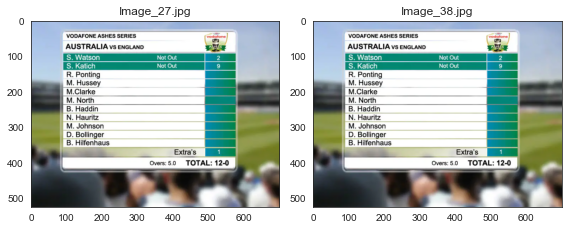

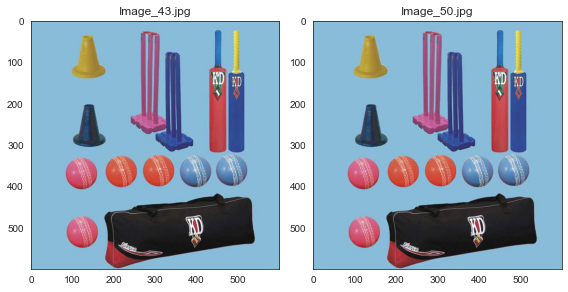

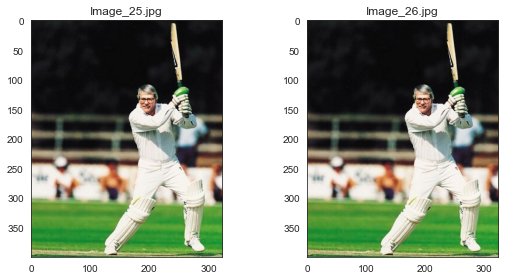

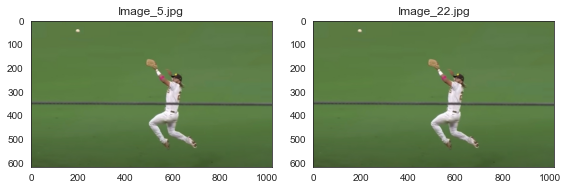

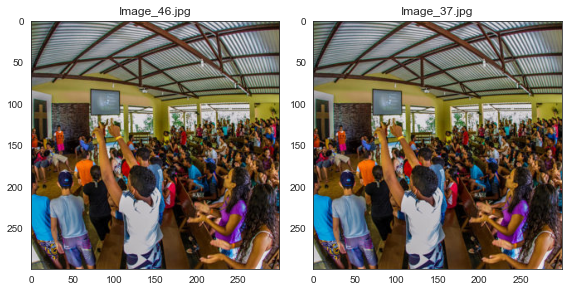

...

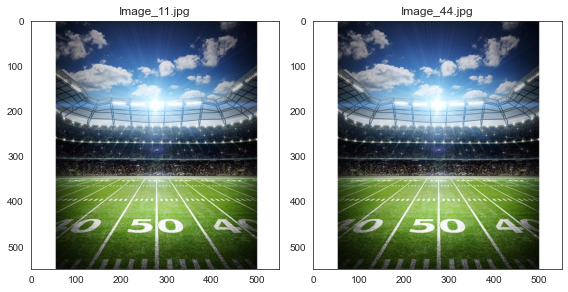

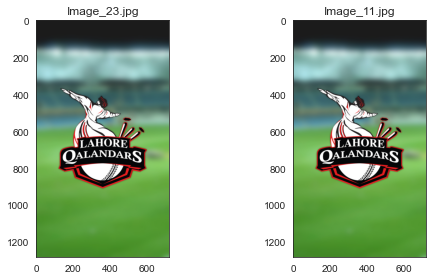

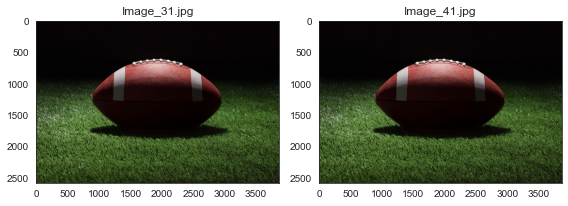

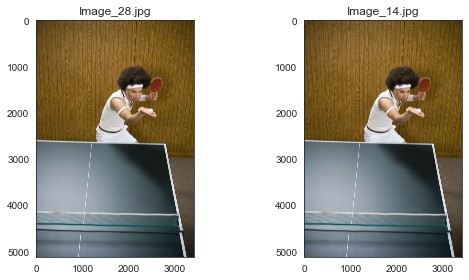

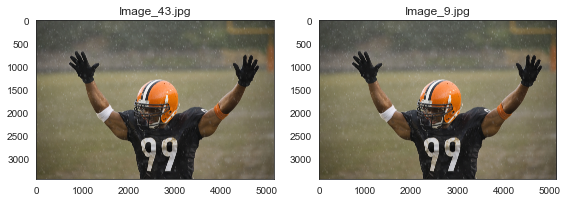

In [131]:

for i in size_dup:
    rep = list(df_new_img.loc[(df_new_img['size'] == i)]['path'])
     # Display misspredicted testing images with the real label (R) and the predicted one (P):
    fig, axs = plt.subplots(1, len(rep), sharey=False, tight_layout=True, figsize=(16*len(rep),16), facecolor='white')
    fig.set_size_inches(4*len(rep),4)
    n=0
    for j in rep:    
        image = mpimg.imread(j)
        axs[n].imshow(image)
        axs[n].set(title= j.split('\\')[-1])
        n=n+1
    plt.show()


Only with the size of the image in bites is a good indicator of duplicated images. However, shape will also be used to filtrate repeated images by proceeding with drop_duplicates with a subset:

In [114]:
df_new_img_nd = df_new_img.copy()
df_new_img_nd.drop_duplicates(subset = ['size','shape'], keep = 'last', inplace= True)
print (f'Initial dataframe had {len (df_new_img)} images.\nAfter deleting repeated files it has {len(df_new_img_nd)} images.')

Initial dataframe had 562 images.
After deleting repeated files it has 548 images.


From the previous pictures, it can be observed that many images are not representative of the suposed class/label which they are suposed to belong to. It is required a class/label validation to confirm theycan be used for training in the image classification model. 

### Class/label validation

In [287]:
# previous process converted to a function to be used again
def remove_duplicated_img (lst):
    ''' Funtion to remove duplicated images
            INPUT: a list of full paths to images
            OUTPUT: a list of full paths to images after checking its similarity by size and shape. 
    '''
    size_list, shape_list = [], []
    for i in lst:
        size, shape = image_features(i)
        size_list.append(size)
        shape_list.append(shape)

    zipped = list(zip(lst, size_list , shape_list))
    df = pd.DataFrame(zipped, columns=['path', 'size','shape'])
    df.drop_duplicates(subset = ['size','shape'], keep = 'last', inplace= True)
    new_lst = list(df.path)
    print (f'Initial list of images had {len (lst)} images.\nAfter deleting repeated images, there are {len (new_lst)} images.')
    return new_lst

In [255]:
def check_image(image_path):
    '''Fuction to validate image as aimed for training. It asks user whether the class/label assigned to the 
    images is right, doubtful or wrong. The proposed class is deduced from the folders where is stored.
            INPUT: image path.
            OUTPUT: a string saying label/class and its validation code, options: 'valid' / 'not valid' / 'doubtful'             
            '''
    if 'baseball' in image_path:
        label = 'baseball'
    elif 'cricket' in image_path:
        label = 'cricket'
    elif 'football' in image_path:
        label = 'football' 
    elif 'soccer' in image_path:
        label = 'football' 
    else:
        label = 'unknown label' 
    classification = 'not checked'
    if cv2.haveImageReader(image_path): #check if opencv can read the image

        #  OPEN IMAGE FOR 3 seconds
        '''img=load_img(image_path, target_size=(299,299))
        img=img_to_array(img)  
        img=img/255.0              
        plt.figure(figsize=(30., 30.))  
        plt.matshow(img) 
        plt.show()'''
       
        DRIVER_PATH = 'c:\\Users\\march\\chromedriver.exe'
        driver = webdriver.Chrome(DRIVER_PATH)
        driver.get(image_path)
        time.sleep (1)
        driver.close()

        correct=False
        while correct==False:
            resposta = input (f'The image is useful to {label} ?\n Options: 1 = VALID / 2 = UNKNOWN / 3 = NOT VALID / 0 to EXIT')
            if resposta == '':
                resposta = 4
            resposta = int(resposta)
            if resposta in [1,2,3]:
                correct=True                         
            else:
                print ('Incorrect answer!! \n Please, choose a choice within the list:  1 / 2 / 3 !!!\n')        
        if resposta ==1:
            classification = 'valid' 
        elif resposta ==3:
            classification = 'not valid' 
        elif resposta ==2:
            classification = 'unknown'
        cv2.destroyAllWindows()
        return label, classification
    else:
        print ('It was not able to open the image. Possible causes: incorrect route, synthaxis, missing permissions,...')
        cv2.destroyAllWindows()
        return label, classification

In [232]:
def validation_df(list_paths):
    ''' Funtion to extract the validation info in a dataframe.
            INPUT: a list with full paths to images
            OUTPUT: a dataframe containing image path, label, labels_validation
            HIGHLIGHT: label is infered with the folder that contain the image!!
    '''
    l_path, l_label, l_validation_code =[],[],[]
    for i  in list_paths:
        label_h, validation_code_h = check_image(i)
        print (f' label: {label_h} and validation code: {validation_code_h}.') 
        l_path.append(i)  
        l_label.append (label_h)
        l_validation_code.append (validation_code_h) 

    zipped = list(zip(l_path, l_label , l_validation_code))
    df  = pd.DataFrame(zipped, columns=['path', 'label', 'validation_code'])

    return df
        
    

In [233]:
# 1st validation of images (not repeated)
df_validation_1 = validation_df (list(df_new_img_nd.path))

C:\Users\march\AppData\Local\Temp\ipykernel_21836\1163685507.py:27: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Chrome(DRIVER_PATH)


 label: baseball and validation code: valid.
 label: baseball and validation code: not valid.
 label: baseball and validation code: not valid.
 label: baseball and validation code: not valid.
 label: baseball and validation code: not valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: not valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: not valid.
 label: baseball and validation code: not valid.
 label: baseball and validation code: not valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: not valid.
 label: baseball and validation code: not valid.
 label: basebal

In [234]:
df_validation_1.to_csv('1st_img_validation.csv')

In [238]:
df_validation_1.groupby('validation_code').count()

,path,label
validation_code,,
not valid,262,262
unknown,19,19
valid,267,267


In [241]:
print (f"From {len(df_validation_1)} images {df_validation_1.groupby('validation_code').count().loc['not valid', 'path']} were found as not valid, {df_validation_1.groupby('validation_code').count().loc['valid', 'path']} as valid and {df_validation_1.groupby('validation_code').count().loc['unknown', 'path']} were doubtul or there was an issue in the selection.")

From 548 images 262 were found as not valid, 267 as valid and 19 were doubtul or there was an issue in the selection.


Let's perform a 2nd validation screening to ensure this validation. Ideally,  __validation screening should be done many times by different people to avoid bias in the selection__. As it takes long time to screen and validate all prictures, the second time will be performed on classifies as valid and also the unknown images.

In [247]:
# 2nd validation of images (not repeated)
# Get the list with valid and unknown classified images:
lst_path_1st_Val = list (df_validation_1[(df_validation_1['validation_code'] == 'valid')| (df_validation_1['validation_code'] == 'unknown')]['path'])
# Do the screening to generate a 2nd dataframe:
df_validation_2 = validation_df (lst_path_1st_Val)

C:\Users\march\AppData\Local\Temp\ipykernel_21836\1163685507.py:27: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Chrome(DRIVER_PATH)


 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: baseball and validation code: valid.
 label: ba

In [248]:
df_validation_2.to_csv('2nd_img_validation.csv')

In [251]:
df_validation_2.groupby('validation_code').count()

,path,label
validation_code,,
not valid,28,28
valid,258,258


In [252]:
df_validation_2.groupby('label').count()

,path,validation_code
label,,
baseball,124,124
cricket,129,129
football,33,33


There are much fewer pictures of football as the search engine (Bing) found pictures of american football, but we aim soccer. Let's do again the process of scrapping and validation with 'soccer': 

In [254]:
for key_word in ['soccer field', 'soccer player', 'soccer match']:
    downloader.download(key_word, limit = 50,  output_dir = new_img_dir, adult_filter_off=True, force_replace=False, timeout=60, verbose=True)


[%] Downloading Images to c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\soccer field


[!!]Indexing page: 1

[%] Indexed 18 Images on Page 1.


[%] Downloading Image #1 from http://1.bp.blogspot.com/-Lzoop-2PVVI/Tp4VW0cYaKI/AAAAAAAADDM/Ztk7BGlQ3Pw/s1600/soccer+field.jpg
[%] File Downloaded !

[%] Downloading Image #2 from https://ak.picdn.net/shutterstock/videos/20345773/thumb/1.jpg
[%] File Downloaded !

[%] Downloading Image #3 from http://images.freeimages.com/images/large-previews/6f0/soccer-field-1563028.jpg
[%] File Downloaded !

[%] Downloading Image #4 from https://images.freeimages.com/images/large-previews/096/soccer-field-1462904.jpg
[%] File Downloaded !

[%] Downloading Image #5 from http://farm4.staticflickr.com/3055/3046080895_a252069e6e_z.jpg?zz=1
[%] File Downloaded !

[%] Downloading Image #6 from https://static1.bigstockphoto.com/1/5/1/large1500/1519066.jpg
[%] File Downloaded !

[%] Downloading Image #7 from https://media.getty

In [257]:
soccer_folders = ['soccer field','soccer match','soccer player']
# transform to jpg files
new_img_lst = []
for i in soccer_folders:
    path = os.path.join (new_img_dir, i)
    for j in os.listdir(path):
        img_path = os.path.join (path, j)        
        if img_path.split('.')[1] != 'jpg':
            try:
                new_name = img_path.split('.')[0]+'.jpg'
                to_jpg_converter(path, j)
                new_img_lst.append (os.path.join (path, new_name))
            except:
                print (f'Problems with file:\n {img_path}\n It was deleted. \n')
                os.remove (img_path)
        else:
            new_img_lst.append (img_path)


Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\soccer field\Image_23.jpeg
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\soccer field\Image_36.JPG
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\soccer match\Image_31.png
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\soccer match\Image_35.png
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\soccer match\Image_49.png
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\output\new_images\soccer match\Image_6.jpeg
 It was deleted. 

Problems with file:
 c:\Users\march\000 Treball Ju`yter 000\Hackathons\imag_recognition\outpu

In [259]:
print (f'From 150 pictures, {150- len (new_img_lst)} images were deleted due to problems of manipulation.')

From 150 pictures, 8 images were deleted due to problems of manipulation.


In [260]:
# dataframe generation with metadata size and dimensions of images
size_list, shape_list = [], []
for i in new_img_lst:
    size, shape = image_features(i)
    size_list.append(size)
    shape_list.append(shape)

zipped = list(zip(new_img_lst, size_list , shape_list))
df_new_img_socc = pd.DataFrame(zipped, columns=['path', 'size','shape'])

In [261]:
df_socc = df_new_img_socc.copy()
df_socc.drop_duplicates(subset = ['size','shape'], keep = 'last', inplace= True)
print (f'Initial dataframe had {len (df_new_img_socc)} images.\nAfter deleting repeated files it has {len(df_socc)} images.')

Initial dataframe had 142 images.
After deleting repeated files it has 140 images.


In [263]:
# 1st validation of soccer images 
df_socc_val_1 = validation_df (list(df_socc.path))

C:\Users\march\AppData\Local\Temp\ipykernel_21836\1224921828.py:29: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Chrome(DRIVER_PATH)


 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: not valid.
 label: football and validation code: not valid.
 label: football and validation code: not valid.
 label: football and validation code: not valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: not valid.
 label: football and validation code: not valid.
 label: football and validation code: not valid.
 label: football and validation code: not valid.
 label: football and validation code: not valid.
 label: football and validation code: not valid.
 label: football and validation code: valid.
 label: football and validation code: not valid.
 label: football and validation code: valid.
 label: football and validation code: not valid.
 label:

In [264]:
df_socc_val_1.groupby('validation_code').count()

,path,label
validation_code,,
not valid,69,69
unknown,1,1
valid,70,70


In [ ]:
Half of the initial images were discarted. A 2nd validation it is performed with the remaining images 

In [266]:
# 2nd validation of images 
# Get the list with valid and unknown classified images:
lst_socc_1st_Val = list (df_socc_val_1[(df_socc_val_1['validation_code'] == 'valid')| (df_socc_val_1['validation_code'] == 'unknown')]['path'])
# Do the screening to generate a 2nd dataframe:
df_socc_val_2 = validation_df (lst_socc_1st_Val)

C:\Users\march\AppData\Local\Temp\ipykernel_21836\1224921828.py:29: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Chrome(DRIVER_PATH)


 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: not valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: not valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 label: football and validation code: valid.
 l

In [267]:
df_socc_val_2.groupby('validation_code').count()

,path,label
validation_code,,
not valid,5,5
valid,66,66


In [288]:
# Get the list with valid classified images of 2nd validation:
lst_socc_2nd_Val = list (df_socc_val_2[df_socc_val_2['validation_code'] == 'valid']['path'])
# Let's join all images labeled as football:
lst_socc_1st_batch = list (df_validation_2[(df_validation_2.validation_code =='valid')&(df_validation_2.label =='football')]['path'])
lst_football = lst_socc_2nd_Val + lst_socc_1st_batch

In [289]:
# remove any dupplicated image:
lst_football = remove_duplicated_img (lst_football) 

Initial list of images had 98 images.
After deleting repeated images, there are 97 images.


In [ ]:
It's time to join initial images with new validated images and check for dupplicated

In [298]:
lst_baseball = list (df_validation_2[(df_validation_2.validation_code =='valid')&(df_validation_2.label =='baseball')]['path'])

lst_cricket = list (df_validation_2[(df_validation_2.validation_code =='valid')&(df_validation_2.label =='cricket')]['path'])


In [ ]:
lst_cricket = list (df_validation_2[(df_validation_2.validation_code =='valid')&(df_validation_2.label =='cricket')]['path'])


In [301]:
# Join all paths of new pictures and labels in an unique dataframe:
df_football = pd.DataFrame (lst_football, columns=['path'])
df_football['label'] = 'football'
df_baseball = pd.DataFrame (lst_baseball, columns=['path'])
df_baseball['label'] = 'baseball'
df_cricket = pd.DataFrame (lst_cricket, columns=['path'])
df_cricket['label'] = 'cricket'

df_sports_new = pd.concat([df_baseball, df_cricket, df_football ], axis=0)
len (df_sports_new)


323

In [302]:
df_sports_new.groupby('label').count()

,path
label,
baseball,111
cricket,115
football,97


Ammount of pictures for each class/label are similar and no further corrections will be made if there are no new discarded pictures.

Let's join new images with old images and check for duppicated images:

In [315]:
# A dicctionary that contains three different list of image's paths, each key correspond to the proper label/class 
dict_path_img ={}
for i in os.listdir(train_images_dir):
       path = (os.path.join(train_images_dir, i))
       lst_img_path = [(path +'\\'+ x)for x in os.listdir (path)]
       total_list = lst_img_path + list(df_sports_new[df_sports_new['label'] == i]['path'])
       total_list2 = remove_duplicated_img (total_list)
       print (f"original list {len (lst_img_path)} + new list {len (list(df_sports_new[df_sports_new['label'] == i]['path']))} ---> total {len(total_list2)} labelled as {i} after removing {len(total_list)-len(total_list2)} duplicates.\n")
       dict_path_img [i] = total_list2

Initial list of images had 177 images.
After deleting repeated images, there are 177 images.
original list 66 + new list 111 ---> total 177 labelled as baseball after removing 0 duplicates.

Initial list of images had 195 images.
After deleting repeated images, there are 195 images.
original list 80 + new list 115 ---> total 195 labelled as cricket after removing 0 duplicates.

Initial list of images had 161 images.
After deleting repeated images, there are 161 images.
original list 64 + new list 97 ---> total 161 labelled as football after removing 0 duplicates.



No dupplicates were found! Let's store image files in proper folders with new names to avoid dupplicates in the name:

In [319]:
train_images_dir

'c:\\Users\\march\\000 Treball Ju`yter 000\\Hackathons\\imag_recognition\\train'

In [322]:
save_dir_extended_train = 'c:\\Users\\march\\000 Treball Ju`yter 000\\Hackathons\\imag_recognition\\train_ext'
   
for i in class_sport:
    sv_dir = save_dir_extended_train + '\\'+ i
    z = 1
    for j in dict_path_img[i]:
        name_img = i + '_img_' + str(z) + '.jpg'
        path_img = sv_dir + '\\' + name_img
        img = Image.open(j)
        img.save(path_img)
        img.close()
        z += 1


# Xception trained with extended images

In [324]:
# Assign main directories to variables:
main_dir=os.path.dirname(sys.path[0])
train_images_dir = main_dir +'\\imag_recognition\\train_ext'
path_test = main_dir +'\\imag_recognition\\test2'
save_dir = main_dir +'\\imag_recognition\\output'


BATCH_SIZE = 32
IMG_SIZE = (299, 299)
train_dataset = tf.keras.utils.image_dataset_from_directory(train_images_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)
validation_dataset = tf.keras.utils.image_dataset_from_directory(path_test,
                                                                 shuffle=True,
                                                                 batch_size=41,
                                                                 image_size=IMG_SIZE)

Found 533 files belonging to 3 classes.
Found 41 files belonging to 3 classes.


In [327]:
preprocess_input = tf.keras.applications.xception.preprocess_input

base_model =   Xception (weights='imagenet', 
                include_top=False, 
                input_shape=(299, 299, 3))
                
# freeze the layers of the pretrained model
for layer in base_model.layers:
    layer.trainable = False

data_augmentation = tf.keras.Sequential([
  # A preprocessing layer which randomly flips images during training.
  tf.keras.layers.RandomFlip('horizontal_and_vertical'),
  # A preprocessing layer which randomly rotates images during training.
  tf.keras.layers.RandomRotation(0.2)])    

inputs = tf.keras.Input(shape=(299, 299, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = GlobalAveragePooling2D()(x)    
x = keras.layers.Dense(1024, activation='relu')(x)
x = keras.layers.Dropout(0.2)(x)                  
x = keras.layers.Dense(3, activation='softmax')(x)  
model_pretrain_Xception_ext = Model(inputs, x) 

In [328]:
base_learning_rate = 0.0001

model_pretrain_Xception_ext.compile (optimizer = 'adam', 
                                loss = 'sparse_categorical_crossentropy',            
                                metrics=['accuracy'])

In [332]:
callbacks = myCallback() 

initial_epochs = 40

history_pretrain_Xception_ext = model_pretrain_Xception_ext.fit(train_dataset,
                                                        epochs=initial_epochs,                    
                                                        validation_data = validation_dataset,
                                                        callbacks=[callbacks])

Epoch 1/40
17/17 [==============================] - 248s 13s/step - loss: 0.9694 - accuracy: 0.5497 - val_loss: 0.6320 - val_accuracy: 0.6341
Epoch 2/40
17/17 [==============================] - 249s 15s/step - loss: 0.5800 - accuracy: 0.7580 - val_loss: 0.3265 - val_accuracy: 0.9268
Epoch 3/40
17/17 [==============================] - 244s 14s/step - loss: 0.4688 - accuracy: 0.8143 - val_loss: 0.2841 - val_accuracy: 0.9512
Epoch 4/40
17/17 [==============================] - 244s 14s/step - loss: 0.3829 - accuracy: 0.8555 - val_loss: 0.2897 - val_accuracy: 0.9024
Epoch 5/40
17/17 [==============================] - 255s 15s/step - loss: 0.3282 - accuracy: 0.8743 - val_loss: 0.2652 - val_accuracy: 0.9268
Epoch 6/40
17/17 [==============================] - 272s 16s/step - loss: 0.2938 - accuracy: 0.8912 - val_loss: 0.2112 - val_accuracy: 0.9268
Epoch 7/40
17/17 [==============================] - 260s 15s/step - loss: 0.2950 - accuracy: 0.8893 - val_loss: 0.3763 - val_accuracy: 0.8293
Epoch 

Model saved. Date:  2022_09_22_15:04


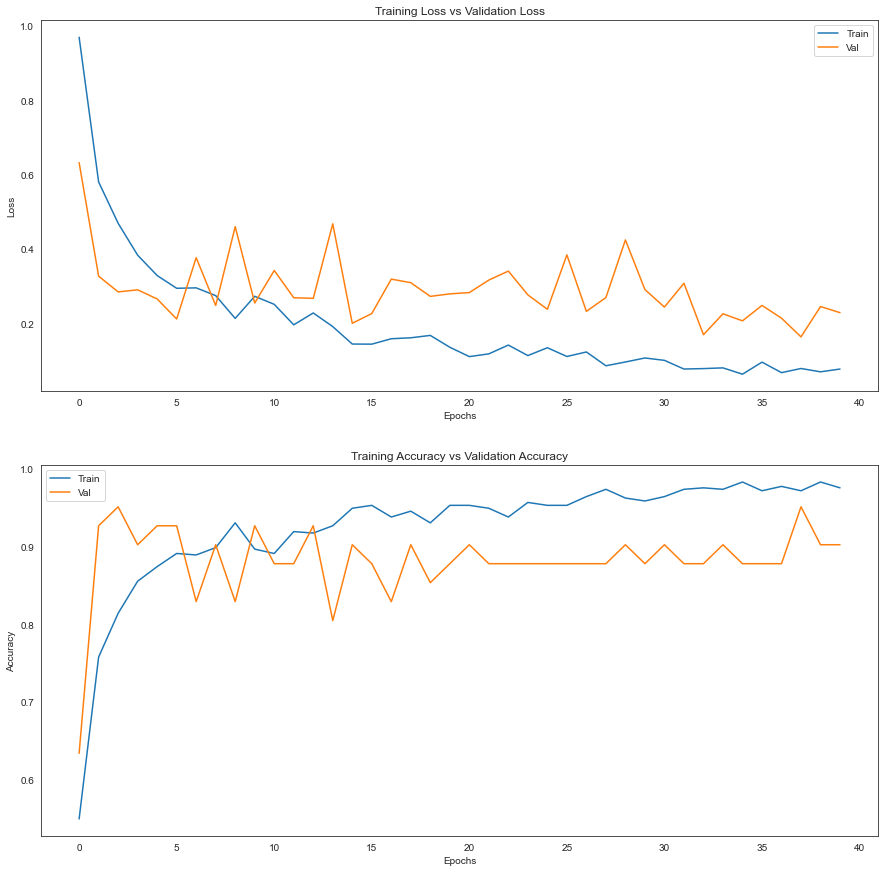

In [340]:
model_pretrain_Xception_ext.__name__='Xception_pretrained_ext_aug'
save_model (model_pretrain_Xception_ext)

sns.set_style('white')
plot_loss_accur (history_pretrain_Xception_ext)

Let's load the saved model and make predictions with the test set of images:

In [363]:
CNN_model = load_model_and_weights('Xception_pretrained_ext_aug')

predictions =[]
true_labels = list (pd.read_csv('true_labels_test.csv').true_label)
test_images = list (pd.read_csv('true_labels_test.csv').path)

for image_test_path in test_images:
    image_test = tf.keras.utils.load_img(image_test_path, 
                                        target_size=(299, 299))
    img_array = tf.keras.utils.img_to_array(image_test)
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    predictions.append(CNN_model.predict (img_array))


Model loaded from PC
1/1 [==============================] - 0s 484ms/step


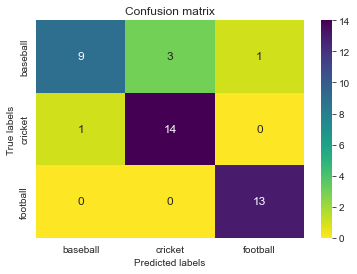

In [364]:
# label_real_num = true_labels
label_predicted_num = [ x.argmax() for x in predictions]
label_predicted = [ class_sport [x.argmax()] for x in predictions]
label_real = [ class_sport [x] for x in true_labels]

sns.set_style ('white')
confusion_matrix_predictions (label_real_num, label_predicted_num, class_sport)
report_metrics_ext = report_df(label_real, label_predicted)

In [ ]:
# Saving in a text file all installed libraries in the environment used to run this project.
!pip freeze > requirements.txt 